**SegResNet FedProx ISLES'22 Lightweight**

**Imports & Drive Mount**

In [1]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [2]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import SegResNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings
import shutil

In [3]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [4]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [5]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/SegResNet/Federated_SegResNet_checkpoints"
log_dir = "D:/F25-156/SegResNet/Federated_SegResNet_logs"

# Remove old directories if they exist
if os.path.exists(checkpoint_dir):
    shutil.rmtree(checkpoint_dir)

if os.path.exists(log_dir):
    shutil.rmtree(log_dir)

# Recreate directories
os.makedirs(checkpoint_dir)
os.makedirs(log_dir)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

Checkpoints will be saved to: D:/F25-156/SegResNet/Federated_SegResNet_checkpoints
TensorBoard logs will be saved to: D:/F25-156/SegResNet/Federated_SegResNet_logs


In [6]:
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(42)

**MONAI Preprocessing Transforms**

In [7]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [8]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [9]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 40 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


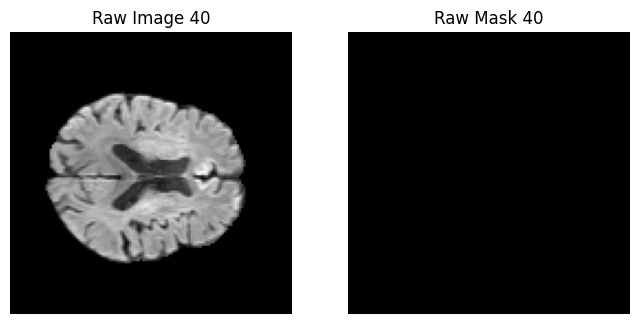

Sample 7 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


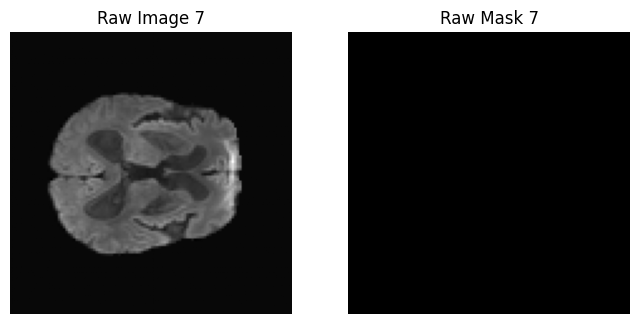

Client 0 - Preprocessed Samples:
Sample 40 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


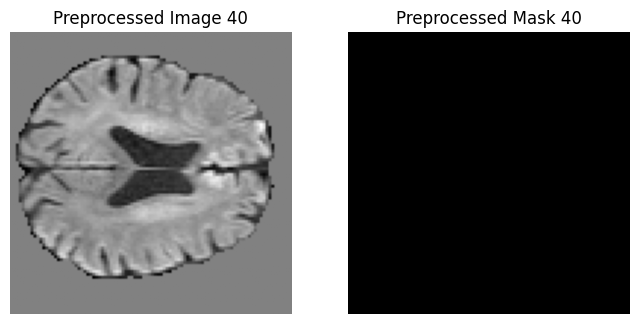

Sample 7 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


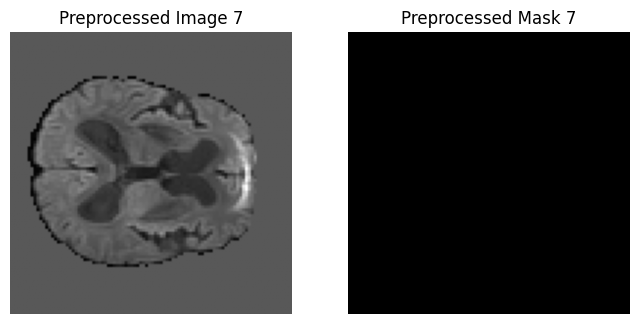

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 1 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


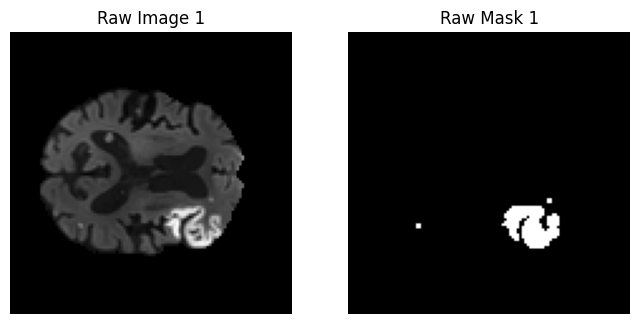

Sample 47 | Image shape: (192, 192, 30) | Mask shape: (192, 192, 30) | Mask Values: tensor([0.0000, 1.0000], dtype=torch.float64)


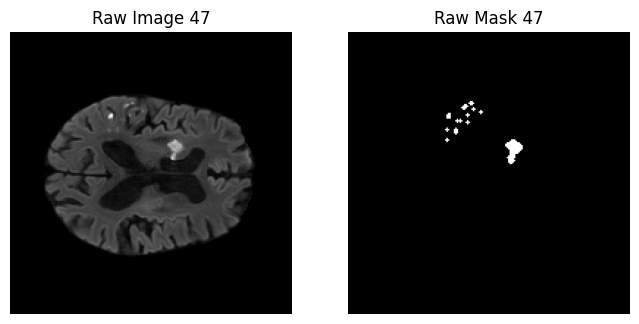

Client 1 - Preprocessed Samples:
Sample 1 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


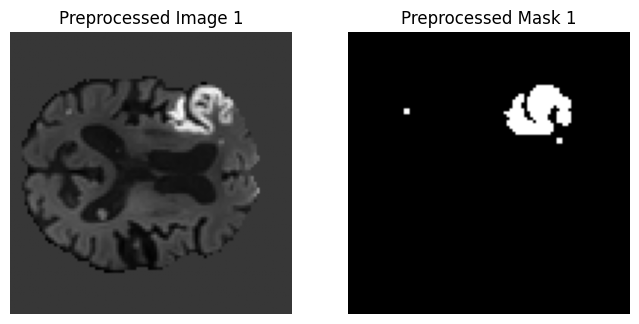

Sample 47 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


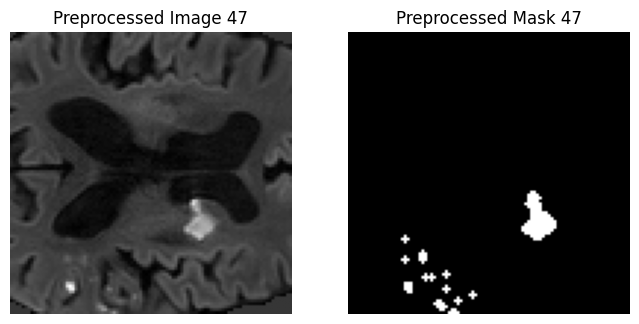

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


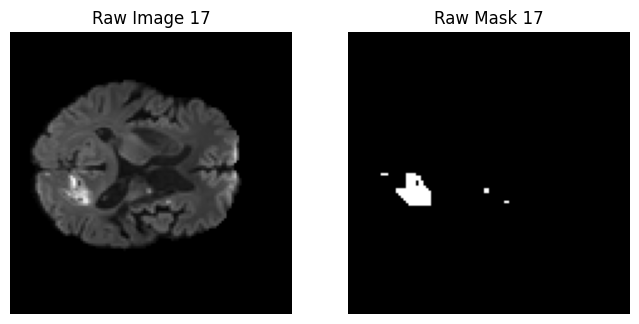

Sample 15 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


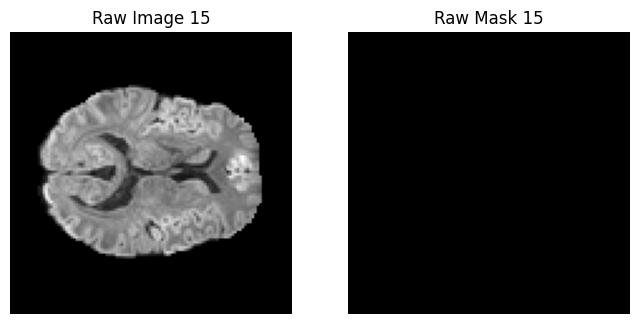

Client 2 - Preprocessed Samples:
Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


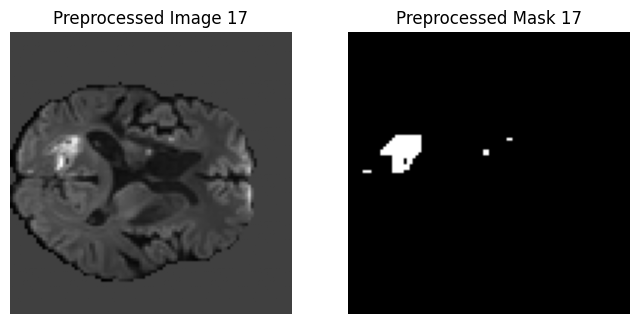

Sample 15 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


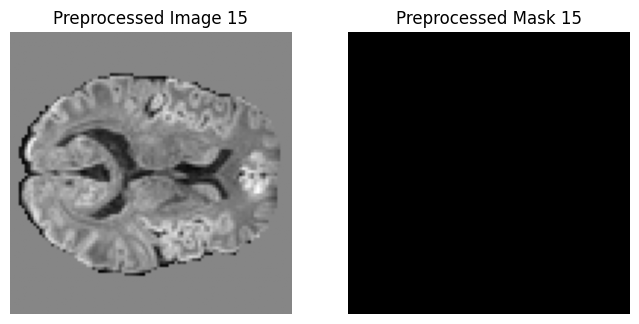

Client 2 samples: 50


In [10]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)

        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [11]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


ResNet

In [12]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [13]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda:0


In [14]:
def create_model():
    model = SegResNet(
        spatial_dims=3,
        in_channels=1,          # DWI is single channel
        out_channels=1,         # Binary lesion mask
        init_filters=16,        # similar starting capacity as UNet
        blocks_down=(1, 2, 2, 4),
        blocks_up=(1, 1, 1),
        dropout_prob=0.2
    ).to(device)
    print(model)
    return model

In [15]:
# Federated:
# Initial feature extractor
# Full encoder

# Personalized:
# Decoder
# Upsampling path
# Segmentation head

SHARED_LAYER_PREFIXES = [
    "convInit",
    "down_layers"
]

**Client Class**

In [16]:
class Client:
    def __init__(self, client_id, dataset, device, mu=0.01):
        self.id = client_id
        self.loader = DataLoader(
            dataset,
            batch_size=1,
            shuffle=True,
        )
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.mu = mu  # FedProx coefficient
        self.best_dice = 0.0

        # stores encoder params from server
        self.global_encoder_params = None

    def loss_fn(self, y_pred, y_true):
        return 0.7 * self.dice_loss(y_pred, y_true) + 0.3 * self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        state = self.model.state_dict()
        return {
            k: v.cpu().clone()
            for k, v in state.items()
            if any(k.startswith(prefix) for prefix in SHARED_LAYER_PREFIXES)
        }

    def set_parameters(self, parameters):
        local_state = self.model.state_dict()

        for k, v in parameters.items():
            if k in local_state:
                local_state[k] = v.to(self.device)

        self.model.load_state_dict(local_state)

    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        global_params = self.global_encoder_params

        for epoch in tqdm(range(1, num_epochs + 1),
                          desc=f"Client {self.id} Epochs",
                          leave=True):

            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)

                # FedProx
                if global_params is not None:
                    prox_term = 0.0
                    for name, param in self.model.named_parameters():
                        if name in global_params:
                            prox_term += ((param - global_params[name]) ** 2).sum()

                    loss = loss + (self.mu / 2) * prox_term

                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # metrics
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)

                if masks.sum() > 0 and pred_binary.sum() > 0:
                    self.hd_metric(pred_binary, masks)

            mean_dice = self.dice_metric.aggregate().item()

            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')

            mean_iou = mean_dice / (2 - mean_dice)

            print(
                f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                f"Loss: {epoch_loss/len(self.loader):.4f} | "
                f"Dice: {mean_dice:.4f} | IoU: {mean_iou:.4f} | "
                f"HD95: {mean_hd95:.4f}"
            )

            self.dice_metric.reset()
            self.hd_metric.reset()

        avg_loss = total_loss / (len(self.loader) * num_epochs)

        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class**

In [17]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7 * self.dice_loss(y_pred, y_true) + 0.3 * self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        global_state = self.global_model.state_dict()

        shared_keys = client_params_list[0].keys()

        for key in shared_keys:
            if torch.is_floating_point(client_params_list[0][key]):

                avg_param = client_params_list[0][key].clone()

                for i in range(1, len(client_params_list)):
                    avg_param += client_params_list[i][key].to(avg_param.device)

                avg_param /= len(client_params_list)
                global_state[key] = avg_param

        self.global_model.load_state_dict(global_state)

    def distribute(self, clients):
        shared_params = {
            k: v.cpu().clone()
            for k, v in self.global_model.state_dict().items()
            if any(k.startswith(prefix) for prefix in SHARED_LAYER_PREFIXES)
        }

        for client in clients:
            client.set_parameters(shared_params)

            # IMPORTANT FIX: pass encoder params for FedProx
            client.global_encoder_params = {
                k: v.clone().detach().to(client.device)
                for k, v in shared_params.items()
            }

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)

                if masks.sum() > 0 and pred_binary.sum() > 0:
                    self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()

        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')

        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")

            print(f"Best global model updated with Dice={mean_dice:.4f}")

        return avg_loss, mean_dice, mean_iou, mean_hd95
    
    def validate_client_on_server(self, client):
        """
        Validate an individual client model using the SERVER validation dataset.
        """

        client.model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:

                images = batch["image"].to(self.device, dtype=torch.float32)
                masks  = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = client.model(images)

                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()

                self.dice_metric(pred_binary, masks)

                if masks.sum() > 0 and pred_binary.sum() > 0:
                    self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)

        mean_dice = self.dice_metric.aggregate().item()

        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float("nan")

        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # ==========================
        # BEST MODEL TRACKING
        # ==========================

        if mean_dice > client.best_dice:
            client.best_dice = mean_dice

            torch.save(
                {
                    "client_id": client.id,
                    "model_state_dict": client.model.state_dict(),
                    "dice": mean_dice,
                    "iou": mean_iou,
                    "hd95": mean_hd95,
                    "loss": avg_loss,
                },
                f"best_client_{client.id}.pth"
            )

            print(
                f"Best validation model updated for Client {client.id} "
                f"with Dice={mean_dice:.4f}"
            )

        return avg_loss, mean_dice, mean_iou, mean_hd95

In [18]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

**Federated Training loop**

In [19]:
communication_rounds = 10  # upper bound
local_epochs = 20
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 2   # stop if Dice does not improve for 2 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}
previous_dice = 0

# Initial distribute before loop starts
server.distribute(clients)

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)

        params = client.get_parameters()
        client_params.append(params)

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client encoder ----
    server.aggregate(client_params)
    
    # ---- Distribute global encoder ----
    server.distribute(clients)

    client_metrics = []

    for client in clients:

        loss, dice, iou, hd95 = server.validate_client_on_server(client)

        client_metrics.append((loss, dice, iou, hd95))

        # Print separate client validation
        print(
            f"Client {client.id} Validation | "
            f"Loss={loss:.4f} | Dice={dice:.4f} | "
            f"IoU={iou:.4f} | HD95={hd95:.4f}"
        )


    # ============================
    # COMBINED VALIDATION METRICS
    # ============================

    val_loss = sum(x[0] for x in client_metrics) / len(client_metrics)
    val_dice = sum(x[1] for x in client_metrics) / len(client_metrics)
    val_iou  = sum(x[2] for x in client_metrics) / len(client_metrics)

    valid_hd95 = [x[3] for x in client_metrics if not np.isnan(x[3])]
    val_hd95 = (
        sum(valid_hd95) / len(valid_hd95)
        if len(valid_hd95) > 0
        else float("nan")
    )


    # Save global history
    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)


    # TensorBoard combined validation
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    # Print combined validation
    print(
        f"\n(Gloabl) Combined Validation | "
        f"Loss={val_loss:.4f} | Dice={val_dice:.4f} | "
        f"IoU={val_iou:.4f} | HD95={val_hd95:.4f}"
    )

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

     # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------

    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7972 | Dice: 0.0955 | IoU: 0.0502 | HD95: 37.8650


Client 0 | Epoch 2/20 | Loss: 0.7759 | Dice: 0.2081 | IoU: 0.1162 | HD95: 35.3370


Client 0 | Epoch 3/20 | Loss: 0.7698 | Dice: 0.2117 | IoU: 0.1184 | HD95: 35.7016


Client 0 | Epoch 4/20 | Loss: 0.7661 | Dice: 0.2149 | IoU: 0.1204 | HD95: 35.0259


Client 0 | Epoch 5/20 | Loss: 0.7606 | Dice: 0.2109 | IoU: 0.1179 | HD95: 35.1233


Client 0 | Epoch 6/20 | Loss: 0.7579 | Dice: 0.2303 | IoU: 0.1301 | HD95: 35.4055


Client 0 | Epoch 7/20 | Loss: 0.7535 | Dice: 0.2312 | IoU: 0.1307 | HD95: 35.4655


Client 0 | Epoch 8/20 | Loss: 0.7495 | Dice: 0.2307 | IoU: 0.1304 | HD95: 35.3047


Client 0 | Epoch 9/20 | Loss: 0.7467 | Dice: 0.2510 | IoU: 0.1435 | HD95: 34.1126


Client 0 | Epoch 10/20 | Loss: 0.7446 | Dice: 0.2462 | IoU: 0.1404 | HD95: 35.2859


Client 0 | Epoch 11/20 | Loss: 0.7421 | Dice: 0.2304 | IoU: 0.1302 | HD95: 34.8190


Client 0 | Epoch 12/20 | Loss: 0.7362 | Dice: 0.2648 | IoU: 0.1526 | HD95: 33.9722


Client 0 | Epoch 13/20 | Loss: 0.7340 | Dice: 0.2297 | IoU: 0.1297 | HD95: 34.6549


Client 0 | Epoch 14/20 | Loss: 0.7313 | Dice: 0.2525 | IoU: 0.1445 | HD95: 34.9989


Client 0 | Epoch 15/20 | Loss: 0.7274 | Dice: 0.2752 | IoU: 0.1596 | HD95: 34.5607


Client 0 | Epoch 16/20 | Loss: 0.7265 | Dice: 0.2518 | IoU: 0.1440 | HD95: 33.7625


Client 0 | Epoch 17/20 | Loss: 0.7224 | Dice: 0.2541 | IoU: 0.1456 | HD95: 34.8187


Client 0 | Epoch 18/20 | Loss: 0.7195 | Dice: 0.2512 | IoU: 0.1437 | HD95: 34.3846


Client 0 | Epoch 19/20 | Loss: 0.7168 | Dice: 0.2538 | IoU: 0.1453 | HD95: 35.0944


Clients Training:  33%|███▎      | 1/3 [02:45<05:31, 165.97s/it]

Client 0 | Epoch 20/20 | Loss: 0.7123 | Dice: 0.2922 | IoU: 0.1711 | HD95: 34.0664
Client 0 | Loss=0.7445 | Dice=0.2922 | IoU=0.1711 | HD95=34.0664


Client 1 | Epoch 1/20 | Loss: 0.8079 | Dice: 0.0544 | IoU: 0.0280 | HD95: 35.4365


Client 1 | Epoch 2/20 | Loss: 0.7884 | Dice: 0.2057 | IoU: 0.1147 | HD95: 33.2353


Client 1 | Epoch 3/20 | Loss: 0.7805 | Dice: 0.2011 | IoU: 0.1118 | HD95: 34.1692


Client 1 | Epoch 4/20 | Loss: 0.7750 | Dice: 0.2162 | IoU: 0.1212 | HD95: 33.4696


Client 1 | Epoch 5/20 | Loss: 0.7705 | Dice: 0.2335 | IoU: 0.1322 | HD95: 33.8935


Client 1 | Epoch 6/20 | Loss: 0.7665 | Dice: 0.2411 | IoU: 0.1371 | HD95: 33.0824


Client 1 | Epoch 7/20 | Loss: 0.7633 | Dice: 0.2389 | IoU: 0.1357 | HD95: 33.5663


Client 1 | Epoch 8/20 | Loss: 0.7608 | Dice: 0.2198 | IoU: 0.1235 | HD95: 33.6847


Client 1 | Epoch 9/20 | Loss: 0.7561 | Dice: 0.2520 | IoU: 0.1441 | HD95: 33.0010


Client 1 | Epoch 10/20 | Loss: 0.7520 | Dice: 0.2473 | IoU: 0.1411 | HD95: 33.5536


Client 1 | Epoch 11/20 | Loss: 0.7493 | Dice: 0.2703 | IoU: 0.1562 | HD95: 31.9570


Client 1 | Epoch 12/20 | Loss: 0.7456 | Dice: 0.2594 | IoU: 0.1490 | HD95: 33.2272


Client 1 | Epoch 13/20 | Loss: 0.7429 | Dice: 0.2715 | IoU: 0.1571 | HD95: 32.4576


Client 1 | Epoch 14/20 | Loss: 0.7400 | Dice: 0.2561 | IoU: 0.1468 | HD95: 33.3089


Client 1 | Epoch 15/20 | Loss: 0.7357 | Dice: 0.3192 | IoU: 0.1899 | HD95: 32.1248


Client 1 | Epoch 16/20 | Loss: 0.7338 | Dice: 0.2825 | IoU: 0.1645 | HD95: 32.0908


Client 1 | Epoch 17/20 | Loss: 0.7320 | Dice: 0.2943 | IoU: 0.1725 | HD95: 32.7554


Client 1 | Epoch 18/20 | Loss: 0.7281 | Dice: 0.2820 | IoU: 0.1641 | HD95: 31.6225


Client 1 | Epoch 19/20 | Loss: 0.7270 | Dice: 0.2887 | IoU: 0.1687 | HD95: 32.1029


Clients Training:  67%|██████▋   | 2/3 [05:45<02:53, 173.67s/it]

Client 1 | Epoch 20/20 | Loss: 0.7246 | Dice: 0.2792 | IoU: 0.1622 | HD95: 31.8416
Client 1 | Loss=0.7540 | Dice=0.2792 | IoU=0.1622 | HD95=31.8416


Client 2 | Epoch 1/20 | Loss: 0.8165 | Dice: 0.1715 | IoU: 0.0938 | HD95: 37.3664


Client 2 | Epoch 2/20 | Loss: 0.7956 | Dice: 0.2110 | IoU: 0.1180 | HD95: 37.0481


Client 2 | Epoch 3/20 | Loss: 0.7882 | Dice: 0.2403 | IoU: 0.1366 | HD95: 36.6511


Client 2 | Epoch 4/20 | Loss: 0.7819 | Dice: 0.2711 | IoU: 0.1568 | HD95: 35.5999


Client 2 | Epoch 5/20 | Loss: 0.7777 | Dice: 0.2600 | IoU: 0.1494 | HD95: 36.0559


Client 2 | Epoch 6/20 | Loss: 0.7730 | Dice: 0.2957 | IoU: 0.1735 | HD95: 35.1223


Client 2 | Epoch 7/20 | Loss: 0.7681 | Dice: 0.2984 | IoU: 0.1754 | HD95: 34.7210


Client 2 | Epoch 8/20 | Loss: 0.7671 | Dice: 0.2930 | IoU: 0.1717 | HD95: 35.3396


Client 2 | Epoch 9/20 | Loss: 0.7611 | Dice: 0.3136 | IoU: 0.1859 | HD95: 33.5986


Client 2 | Epoch 10/20 | Loss: 0.7597 | Dice: 0.2834 | IoU: 0.1651 | HD95: 36.1458


Client 2 | Epoch 11/20 | Loss: 0.7543 | Dice: 0.3076 | IoU: 0.1818 | HD95: 34.8568


Client 2 | Epoch 12/20 | Loss: 0.7498 | Dice: 0.3372 | IoU: 0.2028 | HD95: 33.4044


Client 2 | Epoch 13/20 | Loss: 0.7460 | Dice: 0.3453 | IoU: 0.2087 | HD95: 32.8163


Client 2 | Epoch 14/20 | Loss: 0.7435 | Dice: 0.3506 | IoU: 0.2126 | HD95: 34.3057


Client 2 | Epoch 15/20 | Loss: 0.7398 | Dice: 0.3419 | IoU: 0.2062 | HD95: 33.8426


Client 2 | Epoch 16/20 | Loss: 0.7366 | Dice: 0.3409 | IoU: 0.2055 | HD95: 33.1934


Client 2 | Epoch 17/20 | Loss: 0.7336 | Dice: 0.3490 | IoU: 0.2114 | HD95: 33.7901


Client 2 | Epoch 18/20 | Loss: 0.7286 | Dice: 0.3740 | IoU: 0.2300 | HD95: 32.3802


Client 2 | Epoch 19/20 | Loss: 0.7275 | Dice: 0.3598 | IoU: 0.2194 | HD95: 33.5065


Client 2 Epochs: 100%|██████████| 20/20 [02:57<00:00,  8.86s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.7254 | Dice: 0.3463 | IoU: 0.2094 | HD95: 33.3118
Client 2 | Loss=0.7587 | Dice=0.3463 | IoU=0.2094 | HD95=33.3118


Best validation model updated for Client 0 with Dice=0.2178
Client 0 Validation | Loss=0.7235 | Dice=0.2178 | IoU=0.1222 | HD95=36.6034
Best validation model updated for Client 1 with Dice=0.2609
Client 1 Validation | Loss=0.7345 | Dice=0.2609 | IoU=0.1500 | HD95=33.8285
Best validation model updated for Client 2 with Dice=0.1706
Client 2 Validation | Loss=0.7397 | Dice=0.1706 | IoU=0.0932 | HD95=37.5984

(Gloabl) Combined Validation | Loss=0.7326 | Dice=0.2164 | IoU=0.1218 | HD95=36.0101
Checkpoint saved for round 1 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.7134 | Dice: 0.2408 | IoU: 0.1369 | HD95: 34.0551


Client 0 | Epoch 2/20 | Loss: 0.7084 | Dice: 0.2541 | IoU: 0.1455 | HD95: 34.4888


Client 0 | Epoch 3/20 | Loss: 0.7050 | Dice: 0.2599 | IoU: 0.1494 | HD95: 34.0550


Client 0 | Epoch 4/20 | Loss: 0.7024 | Dice: 0.2573 | IoU: 0.1476 | HD95: 34.2549


Client 0 | Epoch 5/20 | Loss: 0.6989 | Dice: 0.2602 | IoU: 0.1495 | HD95: 34.4471


Client 0 | Epoch 6/20 | Loss: 0.6955 | Dice: 0.2771 | IoU: 0.1608 | HD95: 33.8801


Client 0 | Epoch 7/20 | Loss: 0.6910 | Dice: 0.3043 | IoU: 0.1794 | HD95: 31.8271


Client 0 | Epoch 8/20 | Loss: 0.6950 | Dice: 0.2634 | IoU: 0.1517 | HD95: 35.1025


Client 0 | Epoch 9/20 | Loss: 0.6867 | Dice: 0.3082 | IoU: 0.1821 | HD95: 32.3673


Client 0 | Epoch 10/20 | Loss: 0.6889 | Dice: 0.2334 | IoU: 0.1321 | HD95: 34.7283


Client 0 | Epoch 11/20 | Loss: 0.6854 | Dice: 0.2578 | IoU: 0.1479 | HD95: 34.2483


Client 0 | Epoch 12/20 | Loss: 0.6795 | Dice: 0.2937 | IoU: 0.1721 | HD95: 33.4186


Client 0 | Epoch 13/20 | Loss: 0.6758 | Dice: 0.3016 | IoU: 0.1776 | HD95: 31.7296


Client 0 | Epoch 14/20 | Loss: 0.6750 | Dice: 0.2930 | IoU: 0.1716 | HD95: 32.3182


Client 0 | Epoch 15/20 | Loss: 0.6702 | Dice: 0.3005 | IoU: 0.1768 | HD95: 31.2110


Client 0 | Epoch 16/20 | Loss: 0.6679 | Dice: 0.3056 | IoU: 0.1804 | HD95: 32.5721


Client 0 | Epoch 17/20 | Loss: 0.6643 | Dice: 0.3189 | IoU: 0.1897 | HD95: 31.2202


Client 0 | Epoch 18/20 | Loss: 0.6605 | Dice: 0.3368 | IoU: 0.2025 | HD95: 30.7255


Client 0 | Epoch 19/20 | Loss: 0.6645 | Dice: 0.2851 | IoU: 0.1662 | HD95: 31.7337


Clients Training:  33%|███▎      | 1/3 [02:48<05:36, 168.12s/it]

Client 0 | Epoch 20/20 | Loss: 0.6576 | Dice: 0.2847 | IoU: 0.1660 | HD95: 32.8611
Client 0 | Loss=0.6843 | Dice=0.2847 | IoU=0.1660 | HD95=32.8611


Client 1 | Epoch 1/20 | Loss: 0.7235 | Dice: 0.2483 | IoU: 0.1418 | HD95: 31.9076


Client 1 | Epoch 2/20 | Loss: 0.7193 | Dice: 0.2577 | IoU: 0.1479 | HD95: 31.2003


Client 1 | Epoch 3/20 | Loss: 0.7164 | Dice: 0.2788 | IoU: 0.1620 | HD95: 31.0547


Client 1 | Epoch 4/20 | Loss: 0.7133 | Dice: 0.2821 | IoU: 0.1642 | HD95: 31.0256


Client 1 | Epoch 5/20 | Loss: 0.7114 | Dice: 0.2764 | IoU: 0.1603 | HD95: 30.3230


Client 1 | Epoch 6/20 | Loss: 0.7063 | Dice: 0.2956 | IoU: 0.1735 | HD95: 30.7834


Client 1 | Epoch 7/20 | Loss: 0.7043 | Dice: 0.3038 | IoU: 0.1791 | HD95: 30.9721


Client 1 | Epoch 8/20 | Loss: 0.7001 | Dice: 0.3243 | IoU: 0.1935 | HD95: 30.2043


Client 1 | Epoch 9/20 | Loss: 0.6974 | Dice: 0.3370 | IoU: 0.2026 | HD95: 29.9991


Client 1 | Epoch 10/20 | Loss: 0.6947 | Dice: 0.3228 | IoU: 0.1925 | HD95: 28.9725


Client 1 | Epoch 11/20 | Loss: 0.6908 | Dice: 0.3459 | IoU: 0.2091 | HD95: 28.9139


Client 1 | Epoch 12/20 | Loss: 0.6902 | Dice: 0.3402 | IoU: 0.2049 | HD95: 28.4860


Client 1 | Epoch 13/20 | Loss: 0.6879 | Dice: 0.3024 | IoU: 0.1781 | HD95: 29.9793


Client 1 | Epoch 14/20 | Loss: 0.6849 | Dice: 0.3248 | IoU: 0.1939 | HD95: 29.9916


Client 1 | Epoch 15/20 | Loss: 0.6812 | Dice: 0.3336 | IoU: 0.2002 | HD95: 29.4835


Client 1 | Epoch 16/20 | Loss: 0.6782 | Dice: 0.3238 | IoU: 0.1932 | HD95: 29.0225


Client 1 | Epoch 17/20 | Loss: 0.6758 | Dice: 0.3164 | IoU: 0.1880 | HD95: 30.5681


Client 1 | Epoch 18/20 | Loss: 0.6698 | Dice: 0.3524 | IoU: 0.2139 | HD95: 28.5159


Client 1 | Epoch 19/20 | Loss: 0.6703 | Dice: 0.3355 | IoU: 0.2015 | HD95: 29.4589


Clients Training:  67%|██████▋   | 2/3 [05:36<02:48, 168.29s/it]

Client 1 | Epoch 20/20 | Loss: 0.6626 | Dice: 0.3622 | IoU: 0.2212 | HD95: 28.2246
Client 1 | Loss=0.6939 | Dice=0.3622 | IoU=0.2212 | HD95=28.2246


Client 2 | Epoch 1/20 | Loss: 0.7244 | Dice: 0.3084 | IoU: 0.1823 | HD95: 34.4971


Client 2 | Epoch 2/20 | Loss: 0.7219 | Dice: 0.3232 | IoU: 0.1927 | HD95: 33.2104


Client 2 | Epoch 3/20 | Loss: 0.7153 | Dice: 0.3435 | IoU: 0.2074 | HD95: 31.8161


Client 2 | Epoch 4/20 | Loss: 0.7124 | Dice: 0.3488 | IoU: 0.2112 | HD95: 32.5322


Client 2 | Epoch 5/20 | Loss: 0.7084 | Dice: 0.3670 | IoU: 0.2247 | HD95: 32.3258


Client 2 | Epoch 6/20 | Loss: 0.7080 | Dice: 0.3386 | IoU: 0.2038 | HD95: 33.3542


Client 2 | Epoch 7/20 | Loss: 0.7026 | Dice: 0.3596 | IoU: 0.2192 | HD95: 32.7170


Client 2 | Epoch 8/20 | Loss: 0.6974 | Dice: 0.3780 | IoU: 0.2330 | HD95: 30.4723


Client 2 | Epoch 9/20 | Loss: 0.6941 | Dice: 0.3765 | IoU: 0.2319 | HD95: 30.1265


Client 2 | Epoch 10/20 | Loss: 0.6921 | Dice: 0.3776 | IoU: 0.2327 | HD95: 31.6731


Client 2 | Epoch 11/20 | Loss: 0.6870 | Dice: 0.3809 | IoU: 0.2352 | HD95: 29.2913


Client 2 | Epoch 12/20 | Loss: 0.6836 | Dice: 0.3758 | IoU: 0.2314 | HD95: 30.0755


Client 2 | Epoch 13/20 | Loss: 0.6822 | Dice: 0.3785 | IoU: 0.2334 | HD95: 31.0729


Client 2 | Epoch 14/20 | Loss: 0.6765 | Dice: 0.4119 | IoU: 0.2594 | HD95: 29.5456


Client 2 | Epoch 15/20 | Loss: 0.6732 | Dice: 0.4089 | IoU: 0.2570 | HD95: 28.8529


Client 2 | Epoch 16/20 | Loss: 0.6704 | Dice: 0.4168 | IoU: 0.2632 | HD95: 30.8731


Client 2 | Epoch 17/20 | Loss: 0.6697 | Dice: 0.3750 | IoU: 0.2308 | HD95: 31.1354


Client 2 | Epoch 18/20 | Loss: 0.6660 | Dice: 0.4177 | IoU: 0.2640 | HD95: 29.1140


Client 2 | Epoch 19/20 | Loss: 0.6608 | Dice: 0.4153 | IoU: 0.2621 | HD95: 28.3575


Client 2 Epochs: 100%|██████████| 20/20 [02:47<00:00,  8.37s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.6691 | Dice: 0.3888 | IoU: 0.2413 | HD95: 30.3855
Client 2 | Loss=0.6908 | Dice=0.3888 | IoU=0.2413 | HD95=30.3855


Best validation model updated for Client 0 with Dice=0.2521
Client 0 Validation | Loss=0.6773 | Dice=0.2521 | IoU=0.1442 | HD95=35.0570
Best validation model updated for Client 1 with Dice=0.3538
Client 1 Validation | Loss=0.6866 | Dice=0.3538 | IoU=0.2149 | HD95=28.4961
Best validation model updated for Client 2 with Dice=0.2663
Client 2 Validation | Loss=0.6924 | Dice=0.2663 | IoU=0.1536 | HD95=34.5536

(Gloabl) Combined Validation | Loss=0.6854 | Dice=0.2907 | IoU=0.1709 | HD95=32.7022
Checkpoint saved for round 2 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.6605 | Dice: 0.2805 | IoU: 0.1631 | HD95: 33.7832


Client 0 | Epoch 2/20 | Loss: 0.6552 | Dice: 0.2934 | IoU: 0.1719 | HD95: 34.2384


Client 0 | Epoch 3/20 | Loss: 0.6482 | Dice: 0.3013 | IoU: 0.1773 | HD95: 32.0597


Client 0 | Epoch 4/20 | Loss: 0.6455 | Dice: 0.2948 | IoU: 0.1729 | HD95: 30.7509


Client 0 | Epoch 5/20 | Loss: 0.6460 | Dice: 0.2859 | IoU: 0.1668 | HD95: 32.7706


Client 0 | Epoch 6/20 | Loss: 0.6350 | Dice: 0.3156 | IoU: 0.1874 | HD95: 32.0665


Client 0 | Epoch 7/20 | Loss: 0.6292 | Dice: 0.3587 | IoU: 0.2185 | HD95: 30.8640


Client 0 | Epoch 8/20 | Loss: 0.6297 | Dice: 0.3424 | IoU: 0.2065 | HD95: 32.1759


Client 0 | Epoch 9/20 | Loss: 0.6205 | Dice: 0.3555 | IoU: 0.2161 | HD95: 28.6433


Client 0 | Epoch 10/20 | Loss: 0.6172 | Dice: 0.3723 | IoU: 0.2287 | HD95: 28.3443


Client 0 | Epoch 11/20 | Loss: 0.6129 | Dice: 0.3779 | IoU: 0.2329 | HD95: 27.9838


Client 0 | Epoch 12/20 | Loss: 0.6043 | Dice: 0.4237 | IoU: 0.2688 | HD95: 27.5552


Client 0 | Epoch 13/20 | Loss: 0.6143 | Dice: 0.3512 | IoU: 0.2130 | HD95: 28.2641


Client 0 | Epoch 14/20 | Loss: 0.6083 | Dice: 0.3325 | IoU: 0.1994 | HD95: 30.6437


Client 0 | Epoch 15/20 | Loss: 0.5986 | Dice: 0.4229 | IoU: 0.2682 | HD95: 26.1012


Client 0 | Epoch 16/20 | Loss: 0.5910 | Dice: 0.4199 | IoU: 0.2657 | HD95: 24.9280


Client 0 | Epoch 17/20 | Loss: 0.5830 | Dice: 0.4218 | IoU: 0.2673 | HD95: 25.8351


Client 0 | Epoch 18/20 | Loss: 0.5807 | Dice: 0.4430 | IoU: 0.2845 | HD95: 26.5823


Client 0 | Epoch 19/20 | Loss: 0.5716 | Dice: 0.4677 | IoU: 0.3053 | HD95: 23.2043


Clients Training:  33%|███▎      | 1/3 [02:43<05:27, 163.61s/it]

Client 0 | Epoch 20/20 | Loss: 0.5737 | Dice: 0.4307 | IoU: 0.2745 | HD95: 26.8621
Client 0 | Loss=0.6163 | Dice=0.4307 | IoU=0.2745 | HD95=26.8621


Client 1 | Epoch 1/20 | Loss: 0.6698 | Dice: 0.2984 | IoU: 0.1753 | HD95: 30.1862


Client 1 | Epoch 2/20 | Loss: 0.6582 | Dice: 0.3306 | IoU: 0.1980 | HD95: 26.1527


Client 1 | Epoch 3/20 | Loss: 0.6525 | Dice: 0.3580 | IoU: 0.2180 | HD95: 27.7243


Client 1 | Epoch 4/20 | Loss: 0.6489 | Dice: 0.3491 | IoU: 0.2115 | HD95: 28.5952


Client 1 | Epoch 5/20 | Loss: 0.6449 | Dice: 0.3455 | IoU: 0.2089 | HD95: 27.5196


Client 1 | Epoch 6/20 | Loss: 0.6385 | Dice: 0.3832 | IoU: 0.2370 | HD95: 26.8234


Client 1 | Epoch 7/20 | Loss: 0.6388 | Dice: 0.3461 | IoU: 0.2093 | HD95: 27.6682


Client 1 | Epoch 8/20 | Loss: 0.6327 | Dice: 0.3844 | IoU: 0.2379 | HD95: 24.1104


Client 1 | Epoch 9/20 | Loss: 0.6263 | Dice: 0.3899 | IoU: 0.2422 | HD95: 26.5325


Client 1 | Epoch 10/20 | Loss: 0.6209 | Dice: 0.4239 | IoU: 0.2689 | HD95: 23.3871


Client 1 | Epoch 11/20 | Loss: 0.6181 | Dice: 0.3777 | IoU: 0.2328 | HD95: 26.8348


Client 1 | Epoch 12/20 | Loss: 0.6118 | Dice: 0.4110 | IoU: 0.2586 | HD95: 24.5141


Client 1 | Epoch 13/20 | Loss: 0.6093 | Dice: 0.3882 | IoU: 0.2409 | HD95: 26.0597


Client 1 | Epoch 14/20 | Loss: 0.6149 | Dice: 0.3446 | IoU: 0.2082 | HD95: 28.0879


Client 1 | Epoch 15/20 | Loss: 0.6034 | Dice: 0.4123 | IoU: 0.2597 | HD95: 25.4793


Client 1 | Epoch 16/20 | Loss: 0.5939 | Dice: 0.4118 | IoU: 0.2593 | HD95: 24.9812


Client 1 | Epoch 17/20 | Loss: 0.5862 | Dice: 0.4448 | IoU: 0.2860 | HD95: 22.4347


Client 1 | Epoch 18/20 | Loss: 0.5787 | Dice: 0.4388 | IoU: 0.2811 | HD95: 24.2716


Client 1 | Epoch 19/20 | Loss: 0.5763 | Dice: 0.4207 | IoU: 0.2664 | HD95: 24.5044


Clients Training:  67%|██████▋   | 2/3 [05:28<02:44, 164.39s/it]

Client 1 | Epoch 20/20 | Loss: 0.5729 | Dice: 0.4361 | IoU: 0.2788 | HD95: 23.0970
Client 1 | Loss=0.6198 | Dice=0.4361 | IoU=0.2788 | HD95=23.0970


Client 2 | Epoch 1/20 | Loss: 0.6541 | Dice: 0.3924 | IoU: 0.2441 | HD95: 29.9478


Client 2 | Epoch 2/20 | Loss: 0.6666 | Dice: 0.3224 | IoU: 0.1922 | HD95: 33.9724


Client 2 | Epoch 3/20 | Loss: 0.6695 | Dice: 0.3342 | IoU: 0.2006 | HD95: 33.6773


Client 2 | Epoch 4/20 | Loss: 0.6481 | Dice: 0.3897 | IoU: 0.2420 | HD95: 32.3466


Client 2 | Epoch 5/20 | Loss: 0.6412 | Dice: 0.4006 | IoU: 0.2505 | HD95: 31.7687


Client 2 | Epoch 6/20 | Loss: 0.6364 | Dice: 0.4128 | IoU: 0.2601 | HD95: 29.2965


Client 2 | Epoch 7/20 | Loss: 0.6346 | Dice: 0.3920 | IoU: 0.2438 | HD95: 31.7194


Client 2 | Epoch 8/20 | Loss: 0.6298 | Dice: 0.4106 | IoU: 0.2583 | HD95: 29.2476


Client 2 | Epoch 9/20 | Loss: 0.6212 | Dice: 0.4481 | IoU: 0.2888 | HD95: 27.9606


Client 2 | Epoch 10/20 | Loss: 0.6152 | Dice: 0.4592 | IoU: 0.2980 | HD95: 28.0075


Client 2 | Epoch 11/20 | Loss: 0.6111 | Dice: 0.4653 | IoU: 0.3032 | HD95: 27.7970


Client 2 | Epoch 12/20 | Loss: 0.6069 | Dice: 0.4600 | IoU: 0.2987 | HD95: 27.7566


Client 2 | Epoch 13/20 | Loss: 0.6036 | Dice: 0.4626 | IoU: 0.3009 | HD95: 27.2920


Client 2 | Epoch 14/20 | Loss: 0.6243 | Dice: 0.3644 | IoU: 0.2228 | HD95: 32.8863


Client 2 | Epoch 15/20 | Loss: 0.6037 | Dice: 0.4207 | IoU: 0.2664 | HD95: 29.3705


Client 2 | Epoch 16/20 | Loss: 0.5951 | Dice: 0.4352 | IoU: 0.2781 | HD95: 29.7603


Client 2 | Epoch 17/20 | Loss: 0.5873 | Dice: 0.4599 | IoU: 0.2986 | HD95: 29.0913


Client 2 | Epoch 18/20 | Loss: 0.5781 | Dice: 0.4750 | IoU: 0.3115 | HD95: 26.0678


Client 2 | Epoch 19/20 | Loss: 0.5669 | Dice: 0.5212 | IoU: 0.3525 | HD95: 25.3588


Client 2 Epochs: 100%|██████████| 20/20 [02:46<00:00,  8.30s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.5666 | Dice: 0.4905 | IoU: 0.3249 | HD95: 25.0062
Client 2 | Loss=0.6180 | Dice=0.4905 | IoU=0.3249 | HD95=25.0062


Best validation model updated for Client 0 with Dice=0.3330
Client 0 Validation | Loss=0.6060 | Dice=0.3330 | IoU=0.1997 | HD95=33.7476
Best validation model updated for Client 1 with Dice=0.4964
Client 1 Validation | Loss=0.6240 | Dice=0.4964 | IoU=0.3301 | HD95=18.1196
Best validation model updated for Client 2 with Dice=0.3923
Client 2 Validation | Loss=0.6311 | Dice=0.3923 | IoU=0.2440 | HD95=25.7749

(Gloabl) Combined Validation | Loss=0.6204 | Dice=0.4072 | IoU=0.2580 | HD95=25.8807
Checkpoint saved for round 3 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.5778 | Dice: 0.3691 | IoU: 0.2263 | HD95: 31.0524


Client 0 | Epoch 2/20 | Loss: 0.5695 | Dice: 0.3861 | IoU: 0.2392 | HD95: 28.4778


Client 0 | Epoch 3/20 | Loss: 0.5604 | Dice: 0.4462 | IoU: 0.2872 | HD95: 26.1019


Client 0 | Epoch 4/20 | Loss: 0.5470 | Dice: 0.4892 | IoU: 0.3238 | HD95: 21.4535


Client 0 | Epoch 5/20 | Loss: 0.5419 | Dice: 0.4847 | IoU: 0.3199 | HD95: 27.3630


Client 0 | Epoch 6/20 | Loss: 0.5350 | Dice: 0.4767 | IoU: 0.3130 | HD95: 24.7034


Client 0 | Epoch 7/20 | Loss: 0.5293 | Dice: 0.4920 | IoU: 0.3263 | HD95: 23.8643


Client 0 | Epoch 8/20 | Loss: 0.5196 | Dice: 0.5164 | IoU: 0.3481 | HD95: 22.0058


Client 0 | Epoch 9/20 | Loss: 0.5099 | Dice: 0.5404 | IoU: 0.3702 | HD95: 21.5545


Client 0 | Epoch 10/20 | Loss: 0.5084 | Dice: 0.5372 | IoU: 0.3672 | HD95: 21.0346


Client 0 | Epoch 11/20 | Loss: 0.5032 | Dice: 0.5186 | IoU: 0.3501 | HD95: 22.9270


Client 0 | Epoch 12/20 | Loss: 0.4941 | Dice: 0.5702 | IoU: 0.3988 | HD95: 19.1926


Client 0 | Epoch 13/20 | Loss: 0.5076 | Dice: 0.4820 | IoU: 0.3175 | HD95: 25.0336


Client 0 | Epoch 14/20 | Loss: 0.4849 | Dice: 0.5698 | IoU: 0.3984 | HD95: 19.9881


Client 0 | Epoch 15/20 | Loss: 0.4652 | Dice: 0.5974 | IoU: 0.4259 | HD95: 19.8826


Client 0 | Epoch 16/20 | Loss: 0.4530 | Dice: 0.6099 | IoU: 0.4387 | HD95: 18.9097


Client 0 | Epoch 17/20 | Loss: 0.4473 | Dice: 0.6116 | IoU: 0.4405 | HD95: 16.6119


Client 0 | Epoch 18/20 | Loss: 0.4297 | Dice: 0.6470 | IoU: 0.4782 | HD95: 15.8772


Client 0 | Epoch 19/20 | Loss: 0.4343 | Dice: 0.6136 | IoU: 0.4426 | HD95: 16.7672


Clients Training:  33%|███▎      | 1/3 [02:39<05:18, 159.29s/it]

Client 0 | Epoch 20/20 | Loss: 0.4225 | Dice: 0.6411 | IoU: 0.4717 | HD95: 16.5744
Client 0 | Loss=0.5020 | Dice=0.6411 | IoU=0.4717 | HD95=16.5744


Client 1 | Epoch 1/20 | Loss: 0.5739 | Dice: 0.4298 | IoU: 0.2737 | HD95: 27.1010


Client 1 | Epoch 2/20 | Loss: 0.5602 | Dice: 0.4407 | IoU: 0.2826 | HD95: 21.6068


Client 1 | Epoch 3/20 | Loss: 0.5482 | Dice: 0.4711 | IoU: 0.3081 | HD95: 22.1426


Client 1 | Epoch 4/20 | Loss: 0.5399 | Dice: 0.4744 | IoU: 0.3110 | HD95: 22.6136


Client 1 | Epoch 5/20 | Loss: 0.5394 | Dice: 0.4847 | IoU: 0.3198 | HD95: 22.8024


Client 1 | Epoch 6/20 | Loss: 0.5342 | Dice: 0.4694 | IoU: 0.3067 | HD95: 21.6884


Client 1 | Epoch 7/20 | Loss: 0.5197 | Dice: 0.5019 | IoU: 0.3350 | HD95: 19.1924


Client 1 | Epoch 8/20 | Loss: 0.5162 | Dice: 0.5057 | IoU: 0.3384 | HD95: 21.1813


Client 1 | Epoch 9/20 | Loss: 0.5069 | Dice: 0.5079 | IoU: 0.3404 | HD95: 19.9156


Client 1 | Epoch 10/20 | Loss: 0.4958 | Dice: 0.5206 | IoU: 0.3519 | HD95: 19.6617


Client 1 | Epoch 11/20 | Loss: 0.4903 | Dice: 0.5195 | IoU: 0.3509 | HD95: 18.6453


Client 1 | Epoch 12/20 | Loss: 0.4812 | Dice: 0.5520 | IoU: 0.3812 | HD95: 19.1184


Client 1 | Epoch 13/20 | Loss: 0.4801 | Dice: 0.5378 | IoU: 0.3678 | HD95: 18.8650


Client 1 | Epoch 14/20 | Loss: 0.4729 | Dice: 0.5339 | IoU: 0.3642 | HD95: 17.7802


Client 1 | Epoch 15/20 | Loss: 0.4650 | Dice: 0.5751 | IoU: 0.4036 | HD95: 18.9524


Client 1 | Epoch 16/20 | Loss: 0.4477 | Dice: 0.5747 | IoU: 0.4032 | HD95: 16.2517


Client 1 | Epoch 17/20 | Loss: 0.4341 | Dice: 0.5806 | IoU: 0.4090 | HD95: 16.2807


Client 1 | Epoch 18/20 | Loss: 0.4324 | Dice: 0.5829 | IoU: 0.4113 | HD95: 17.2490


Client 1 | Epoch 19/20 | Loss: 0.4224 | Dice: 0.5916 | IoU: 0.4201 | HD95: 16.3244


Clients Training:  67%|██████▋   | 2/3 [05:18<02:39, 159.51s/it]

Client 1 | Epoch 20/20 | Loss: 0.4355 | Dice: 0.5723 | IoU: 0.4009 | HD95: 18.2637
Client 1 | Loss=0.4948 | Dice=0.5723 | IoU=0.4009 | HD95=18.2637


Client 2 | Epoch 1/20 | Loss: 0.5730 | Dice: 0.4275 | IoU: 0.2719 | HD95: 29.3140


Client 2 | Epoch 2/20 | Loss: 0.5589 | Dice: 0.4650 | IoU: 0.3030 | HD95: 27.5380


Client 2 | Epoch 3/20 | Loss: 0.5481 | Dice: 0.4905 | IoU: 0.3249 | HD95: 24.6787


Client 2 | Epoch 4/20 | Loss: 0.5367 | Dice: 0.5271 | IoU: 0.3579 | HD95: 22.6738


Client 2 | Epoch 5/20 | Loss: 0.5291 | Dice: 0.5406 | IoU: 0.3704 | HD95: 23.1731


Client 2 | Epoch 6/20 | Loss: 0.5218 | Dice: 0.5411 | IoU: 0.3709 | HD95: 22.2229


Client 2 | Epoch 7/20 | Loss: 0.5136 | Dice: 0.5601 | IoU: 0.3889 | HD95: 20.6115


Client 2 | Epoch 8/20 | Loss: 0.5341 | Dice: 0.4787 | IoU: 0.3146 | HD95: 27.8737


Client 2 | Epoch 9/20 | Loss: 0.5178 | Dice: 0.5112 | IoU: 0.3434 | HD95: 25.7045


Client 2 | Epoch 10/20 | Loss: 0.5043 | Dice: 0.5473 | IoU: 0.3768 | HD95: 22.8046


Client 2 | Epoch 11/20 | Loss: 0.4945 | Dice: 0.5480 | IoU: 0.3774 | HD95: 20.9271


Client 2 | Epoch 12/20 | Loss: 0.5156 | Dice: 0.4753 | IoU: 0.3118 | HD95: 27.7333


Client 2 | Epoch 13/20 | Loss: 0.4830 | Dice: 0.5559 | IoU: 0.3849 | HD95: 24.0019


Client 2 | Epoch 14/20 | Loss: 0.4698 | Dice: 0.5913 | IoU: 0.4197 | HD95: 19.1303


Client 2 | Epoch 15/20 | Loss: 0.4588 | Dice: 0.5908 | IoU: 0.4192 | HD95: 17.8191


Client 2 | Epoch 16/20 | Loss: 0.4538 | Dice: 0.5962 | IoU: 0.4247 | HD95: 20.9606


Client 2 | Epoch 17/20 | Loss: 0.4458 | Dice: 0.6017 | IoU: 0.4303 | HD95: 17.1290


Client 2 | Epoch 18/20 | Loss: 0.4381 | Dice: 0.6191 | IoU: 0.4483 | HD95: 15.9520


Client 2 | Epoch 19/20 | Loss: 0.4253 | Dice: 0.6317 | IoU: 0.4617 | HD95: 16.5121


Client 2 Epochs: 100%|██████████| 20/20 [02:41<00:00,  8.08s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.4242 | Dice: 0.6200 | IoU: 0.4493 | HD95: 18.0337
Client 2 | Loss=0.4973 | Dice=0.6200 | IoU=0.4493 | HD95=18.0337


Best validation model updated for Client 0 with Dice=0.4087
Client 0 Validation | Loss=0.4895 | Dice=0.4087 | IoU=0.2569 | HD95=32.9372
Best validation model updated for Client 1 with Dice=0.5289
Client 1 Validation | Loss=0.4692 | Dice=0.5289 | IoU=0.3596 | HD95=19.8775
Best validation model updated for Client 2 with Dice=0.4725
Client 2 Validation | Loss=0.5209 | Dice=0.4725 | IoU=0.3093 | HD95=23.9661

(Gloabl) Combined Validation | Loss=0.4932 | Dice=0.4701 | IoU=0.3086 | HD95=25.5936
Checkpoint saved for round 4 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.4247 | Dice: 0.5905 | IoU: 0.4190 | HD95: 19.2501


Client 0 | Epoch 2/20 | Loss: 0.4113 | Dice: 0.6222 | IoU: 0.4516 | HD95: 16.7956


Client 0 | Epoch 3/20 | Loss: 0.4185 | Dice: 0.6046 | IoU: 0.4333 | HD95: 17.4681


Client 0 | Epoch 4/20 | Loss: 0.4071 | Dice: 0.6221 | IoU: 0.4515 | HD95: 16.6149


Client 0 | Epoch 5/20 | Loss: 0.4311 | Dice: 0.5522 | IoU: 0.3814 | HD95: 19.5066


Client 0 | Epoch 6/20 | Loss: 0.3882 | Dice: 0.6356 | IoU: 0.4659 | HD95: 14.9771


Client 0 | Epoch 7/20 | Loss: 0.3782 | Dice: 0.6645 | IoU: 0.4975 | HD95: 14.0718


Client 0 | Epoch 8/20 | Loss: 0.3600 | Dice: 0.6858 | IoU: 0.5219 | HD95: 12.9986


Client 0 | Epoch 9/20 | Loss: 0.3546 | Dice: 0.6772 | IoU: 0.5119 | HD95: 13.9900


Client 0 | Epoch 10/20 | Loss: 0.3538 | Dice: 0.6719 | IoU: 0.5060 | HD95: 14.2781


Client 0 | Epoch 11/20 | Loss: 0.3470 | Dice: 0.6883 | IoU: 0.5248 | HD95: 11.8229


Client 0 | Epoch 12/20 | Loss: 0.3425 | Dice: 0.7037 | IoU: 0.5428 | HD95: 11.4631


Client 0 | Epoch 13/20 | Loss: 0.3379 | Dice: 0.6913 | IoU: 0.5283 | HD95: 11.8870


Client 0 | Epoch 14/20 | Loss: 0.3334 | Dice: 0.6987 | IoU: 0.5369 | HD95: 15.2743


Client 0 | Epoch 15/20 | Loss: 0.3277 | Dice: 0.6929 | IoU: 0.5301 | HD95: 13.8220


Client 0 | Epoch 16/20 | Loss: 0.3242 | Dice: 0.7065 | IoU: 0.5462 | HD95: 12.9175


Client 0 | Epoch 17/20 | Loss: 0.3128 | Dice: 0.7162 | IoU: 0.5578 | HD95: 11.6916


Client 0 | Epoch 18/20 | Loss: 0.2924 | Dice: 0.7426 | IoU: 0.5906 | HD95: 9.3167


Client 0 | Epoch 19/20 | Loss: 0.2886 | Dice: 0.7363 | IoU: 0.5827 | HD95: 9.0402


Clients Training:  33%|███▎      | 1/3 [02:34<05:08, 154.38s/it]

Client 0 | Epoch 20/20 | Loss: 0.2825 | Dice: 0.7529 | IoU: 0.6037 | HD95: 9.7199
Client 0 | Loss=0.3558 | Dice=0.7529 | IoU=0.6037 | HD95=9.7199


Client 1 | Epoch 1/20 | Loss: 0.4400 | Dice: 0.5206 | IoU: 0.3519 | HD95: 21.0073


Client 1 | Epoch 2/20 | Loss: 0.4153 | Dice: 0.5644 | IoU: 0.3932 | HD95: 17.3780


Client 1 | Epoch 3/20 | Loss: 0.3906 | Dice: 0.6163 | IoU: 0.4454 | HD95: 15.0136


Client 1 | Epoch 4/20 | Loss: 0.3996 | Dice: 0.5976 | IoU: 0.4261 | HD95: 17.9582


Client 1 | Epoch 5/20 | Loss: 0.3913 | Dice: 0.6019 | IoU: 0.4305 | HD95: 17.0717


Client 1 | Epoch 6/20 | Loss: 0.3730 | Dice: 0.6285 | IoU: 0.4582 | HD95: 15.6966


Client 1 | Epoch 7/20 | Loss: 0.3893 | Dice: 0.5904 | IoU: 0.4188 | HD95: 16.0497


Client 1 | Epoch 8/20 | Loss: 0.3804 | Dice: 0.6041 | IoU: 0.4327 | HD95: 14.6452


Client 1 | Epoch 9/20 | Loss: 0.3699 | Dice: 0.6131 | IoU: 0.4420 | HD95: 15.9619


Client 1 | Epoch 10/20 | Loss: 0.3417 | Dice: 0.6518 | IoU: 0.4834 | HD95: 14.1751


Client 1 | Epoch 11/20 | Loss: 0.3478 | Dice: 0.6206 | IoU: 0.4499 | HD95: 14.0170


Client 1 | Epoch 12/20 | Loss: 0.3292 | Dice: 0.6655 | IoU: 0.4987 | HD95: 11.6685


Client 1 | Epoch 13/20 | Loss: 0.3280 | Dice: 0.6713 | IoU: 0.5052 | HD95: 11.9643


Client 1 | Epoch 14/20 | Loss: 0.3270 | Dice: 0.6684 | IoU: 0.5020 | HD95: 11.2768


Client 1 | Epoch 15/20 | Loss: 0.3134 | Dice: 0.6728 | IoU: 0.5069 | HD95: 11.6338


Client 1 | Epoch 16/20 | Loss: 0.3027 | Dice: 0.6971 | IoU: 0.5351 | HD95: 10.8831


Client 1 | Epoch 17/20 | Loss: 0.3055 | Dice: 0.6812 | IoU: 0.5166 | HD95: 11.3202


Client 1 | Epoch 18/20 | Loss: 0.2927 | Dice: 0.7045 | IoU: 0.5438 | HD95: 11.5163


Client 1 | Epoch 19/20 | Loss: 0.2933 | Dice: 0.6889 | IoU: 0.5254 | HD95: 12.0900


Clients Training:  67%|██████▋   | 2/3 [05:11<02:35, 155.71s/it]

Client 1 | Epoch 20/20 | Loss: 0.3029 | Dice: 0.6652 | IoU: 0.4983 | HD95: 11.5481
Client 1 | Loss=0.3517 | Dice=0.6652 | IoU=0.4983 | HD95=11.5481


Client 2 | Epoch 1/20 | Loss: 0.4336 | Dice: 0.5729 | IoU: 0.4015 | HD95: 20.1197


Client 2 | Epoch 2/20 | Loss: 0.4259 | Dice: 0.5858 | IoU: 0.4143 | HD95: 21.4404


Client 2 | Epoch 3/20 | Loss: 0.4079 | Dice: 0.6126 | IoU: 0.4416 | HD95: 20.7805


Client 2 | Epoch 4/20 | Loss: 0.4049 | Dice: 0.6006 | IoU: 0.4292 | HD95: 18.5050


Client 2 | Epoch 5/20 | Loss: 0.3933 | Dice: 0.6265 | IoU: 0.4561 | HD95: 16.9516


Client 2 | Epoch 6/20 | Loss: 0.3826 | Dice: 0.6502 | IoU: 0.4817 | HD95: 15.1372


Client 2 | Epoch 7/20 | Loss: 0.3942 | Dice: 0.6212 | IoU: 0.4505 | HD95: 17.5127


Client 2 | Epoch 8/20 | Loss: 0.3745 | Dice: 0.6542 | IoU: 0.4861 | HD95: 14.7956


Client 2 | Epoch 9/20 | Loss: 0.3726 | Dice: 0.6419 | IoU: 0.4726 | HD95: 19.1424


Client 2 | Epoch 10/20 | Loss: 0.3575 | Dice: 0.6658 | IoU: 0.4990 | HD95: 14.0744


Client 2 | Epoch 11/20 | Loss: 0.3593 | Dice: 0.6708 | IoU: 0.5046 | HD95: 14.8933


Client 2 | Epoch 12/20 | Loss: 0.3528 | Dice: 0.6682 | IoU: 0.5017 | HD95: 12.8212


Client 2 | Epoch 13/20 | Loss: 0.3498 | Dice: 0.6754 | IoU: 0.5099 | HD95: 13.9840


Client 2 | Epoch 14/20 | Loss: 0.3849 | Dice: 0.6100 | IoU: 0.4388 | HD95: 18.8012


Client 2 | Epoch 15/20 | Loss: 0.3565 | Dice: 0.6641 | IoU: 0.4971 | HD95: 16.3092


Client 2 | Epoch 16/20 | Loss: 0.3415 | Dice: 0.6814 | IoU: 0.5167 | HD95: 14.0326


Client 2 | Epoch 17/20 | Loss: 0.3247 | Dice: 0.7077 | IoU: 0.5477 | HD95: 12.1469


Client 2 | Epoch 18/20 | Loss: 0.3154 | Dice: 0.7027 | IoU: 0.5417 | HD95: 13.1867


Client 2 | Epoch 19/20 | Loss: 0.3127 | Dice: 0.7089 | IoU: 0.5490 | HD95: 13.1306


Client 2 Epochs: 100%|██████████| 20/20 [02:37<00:00,  7.86s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.3023 | Dice: 0.7190 | IoU: 0.5613 | HD95: 12.6170
Client 2 | Loss=0.3673 | Dice=0.7190 | IoU=0.5613 | HD95=12.6170


Best validation model updated for Client 0 with Dice=0.5433
Client 0 Validation | Loss=0.3640 | Dice=0.5433 | IoU=0.3730 | HD95=25.2076
Best validation model updated for Client 1 with Dice=0.6204
Client 1 Validation | Loss=0.3463 | Dice=0.6204 | IoU=0.4496 | HD95=14.2189
Best validation model updated for Client 2 with Dice=0.6402
Client 2 Validation | Loss=0.3953 | Dice=0.6402 | IoU=0.4708 | HD95=18.8189

(Gloabl) Combined Validation | Loss=0.3685 | Dice=0.6013 | IoU=0.4311 | HD95=19.4151
Checkpoint saved for round 5 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.3053 | Dice: 0.6896 | IoU: 0.5263 | HD95: 15.0367


Client 0 | Epoch 2/20 | Loss: 0.2974 | Dice: 0.7090 | IoU: 0.5491 | HD95: 14.3476


Client 0 | Epoch 3/20 | Loss: 0.3017 | Dice: 0.6829 | IoU: 0.5185 | HD95: 12.8253


Client 0 | Epoch 4/20 | Loss: 0.3477 | Dice: 0.6149 | IoU: 0.4439 | HD95: 14.5910


Client 0 | Epoch 5/20 | Loss: 0.3274 | Dice: 0.6547 | IoU: 0.4867 | HD95: 13.9551


Client 0 | Epoch 6/20 | Loss: 0.2849 | Dice: 0.7222 | IoU: 0.5653 | HD95: 10.8208


Client 0 | Epoch 7/20 | Loss: 0.2670 | Dice: 0.7451 | IoU: 0.5938 | HD95: 10.4153


Client 0 | Epoch 8/20 | Loss: 0.2651 | Dice: 0.7383 | IoU: 0.5852 | HD95: 9.6316


Client 0 | Epoch 9/20 | Loss: 0.2592 | Dice: 0.7431 | IoU: 0.5912 | HD95: 8.2067


Client 0 | Epoch 10/20 | Loss: 0.2416 | Dice: 0.7604 | IoU: 0.6134 | HD95: 8.5739


Client 0 | Epoch 11/20 | Loss: 0.2424 | Dice: 0.7546 | IoU: 0.6059 | HD95: 8.1604


Client 0 | Epoch 12/20 | Loss: 0.2386 | Dice: 0.7573 | IoU: 0.6094 | HD95: 8.5963


Client 0 | Epoch 13/20 | Loss: 0.2546 | Dice: 0.7381 | IoU: 0.5849 | HD95: 7.4790


Client 0 | Epoch 14/20 | Loss: 0.2683 | Dice: 0.7171 | IoU: 0.5590 | HD95: 10.0853


Client 0 | Epoch 15/20 | Loss: 0.2815 | Dice: 0.6919 | IoU: 0.5290 | HD95: 13.3069


Client 0 | Epoch 16/20 | Loss: 0.2519 | Dice: 0.7485 | IoU: 0.5980 | HD95: 7.5364


Client 0 | Epoch 17/20 | Loss: 0.2388 | Dice: 0.7605 | IoU: 0.6135 | HD95: 7.7839


Client 0 | Epoch 18/20 | Loss: 0.2250 | Dice: 0.7713 | IoU: 0.6277 | HD95: 7.0462


Client 0 | Epoch 19/20 | Loss: 0.2306 | Dice: 0.7609 | IoU: 0.6141 | HD95: 9.5875


Clients Training:  33%|███▎      | 1/3 [02:33<05:06, 153.04s/it]

Client 0 | Epoch 20/20 | Loss: 0.2271 | Dice: 0.7595 | IoU: 0.6122 | HD95: 7.2296
Client 0 | Loss=0.2678 | Dice=0.7595 | IoU=0.6122 | HD95=7.2296


Client 1 | Epoch 1/20 | Loss: 0.3179 | Dice: 0.6386 | IoU: 0.4691 | HD95: 13.2524


Client 1 | Epoch 2/20 | Loss: 0.3380 | Dice: 0.6018 | IoU: 0.4304 | HD95: 17.3787


Client 1 | Epoch 3/20 | Loss: 0.3290 | Dice: 0.6346 | IoU: 0.4648 | HD95: 14.2817


Client 1 | Epoch 4/20 | Loss: 0.3214 | Dice: 0.6333 | IoU: 0.4634 | HD95: 12.6758


Client 1 | Epoch 5/20 | Loss: 0.2989 | Dice: 0.6662 | IoU: 0.4994 | HD95: 11.7981


Client 1 | Epoch 6/20 | Loss: 0.2618 | Dice: 0.7237 | IoU: 0.5670 | HD95: 9.3502


Client 1 | Epoch 7/20 | Loss: 0.2657 | Dice: 0.7088 | IoU: 0.5489 | HD95: 10.8492


Client 1 | Epoch 8/20 | Loss: 0.2713 | Dice: 0.6943 | IoU: 0.5317 | HD95: 13.5178


Client 1 | Epoch 9/20 | Loss: 0.2550 | Dice: 0.7326 | IoU: 0.5781 | HD95: 10.3569


Client 1 | Epoch 10/20 | Loss: 0.2327 | Dice: 0.7636 | IoU: 0.6175 | HD95: 7.5504


Client 1 | Epoch 11/20 | Loss: 0.2282 | Dice: 0.7717 | IoU: 0.6283 | HD95: 8.9467


Client 1 | Epoch 12/20 | Loss: 0.2451 | Dice: 0.7314 | IoU: 0.5765 | HD95: 8.9675


Client 1 | Epoch 13/20 | Loss: 0.2333 | Dice: 0.7570 | IoU: 0.6090 | HD95: 9.7258


Client 1 | Epoch 14/20 | Loss: 0.2436 | Dice: 0.7369 | IoU: 0.5834 | HD95: 10.1887


Client 1 | Epoch 15/20 | Loss: 0.2349 | Dice: 0.7581 | IoU: 0.6104 | HD95: 9.3881


Client 1 | Epoch 16/20 | Loss: 0.2260 | Dice: 0.7686 | IoU: 0.6241 | HD95: 9.6649


Client 1 | Epoch 17/20 | Loss: 0.2094 | Dice: 0.7816 | IoU: 0.6416 | HD95: 8.5033


Client 1 | Epoch 18/20 | Loss: 0.2173 | Dice: 0.7567 | IoU: 0.6086 | HD95: 8.6722


Client 1 | Epoch 19/20 | Loss: 0.2152 | Dice: 0.7738 | IoU: 0.6310 | HD95: 8.1056


Clients Training:  67%|██████▋   | 2/3 [05:09<02:34, 154.81s/it]

Client 1 | Epoch 20/20 | Loss: 0.2626 | Dice: 0.6941 | IoU: 0.5315 | HD95: 14.2551
Client 1 | Loss=0.2604 | Dice=0.6941 | IoU=0.5315 | HD95=14.2551


Client 2 | Epoch 1/20 | Loss: 0.3185 | Dice: 0.6620 | IoU: 0.4947 | HD95: 15.5945


Client 2 | Epoch 2/20 | Loss: 0.3045 | Dice: 0.7017 | IoU: 0.5404 | HD95: 11.7243


Client 2 | Epoch 3/20 | Loss: 0.3588 | Dice: 0.5843 | IoU: 0.4127 | HD95: 17.8859


Client 2 | Epoch 4/20 | Loss: 0.3049 | Dice: 0.7134 | IoU: 0.5545 | HD95: 12.6290


Client 2 | Epoch 5/20 | Loss: 0.2925 | Dice: 0.7104 | IoU: 0.5509 | HD95: 12.1005


Client 2 | Epoch 6/20 | Loss: 0.2731 | Dice: 0.7579 | IoU: 0.6101 | HD95: 9.0226


Client 2 | Epoch 7/20 | Loss: 0.2779 | Dice: 0.7246 | IoU: 0.5681 | HD95: 12.7150


Client 2 | Epoch 8/20 | Loss: 0.2645 | Dice: 0.7533 | IoU: 0.6043 | HD95: 9.5074


Client 2 | Epoch 9/20 | Loss: 0.2788 | Dice: 0.7252 | IoU: 0.5689 | HD95: 10.4523


Client 2 | Epoch 10/20 | Loss: 0.2711 | Dice: 0.7490 | IoU: 0.5987 | HD95: 10.5856


Client 2 | Epoch 11/20 | Loss: 0.2770 | Dice: 0.7244 | IoU: 0.5679 | HD95: 13.5608


Client 2 | Epoch 12/20 | Loss: 0.2719 | Dice: 0.7337 | IoU: 0.5794 | HD95: 9.7653


Client 2 | Epoch 13/20 | Loss: 0.2576 | Dice: 0.7496 | IoU: 0.5994 | HD95: 11.3222


Client 2 | Epoch 14/20 | Loss: 0.2467 | Dice: 0.7635 | IoU: 0.6175 | HD95: 9.0431


Client 2 | Epoch 15/20 | Loss: 0.2519 | Dice: 0.7605 | IoU: 0.6136 | HD95: 7.8767


Client 2 | Epoch 16/20 | Loss: 0.2598 | Dice: 0.7524 | IoU: 0.6031 | HD95: 10.6970


Client 2 | Epoch 17/20 | Loss: 0.2492 | Dice: 0.7537 | IoU: 0.6048 | HD95: 10.1329


Client 2 | Epoch 18/20 | Loss: 0.2426 | Dice: 0.7624 | IoU: 0.6160 | HD95: 10.3309


Client 2 | Epoch 19/20 | Loss: 0.2347 | Dice: 0.7714 | IoU: 0.6279 | HD95: 9.2218


Client 2 Epochs: 100%|██████████| 20/20 [02:35<00:00,  7.79s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.2274 | Dice: 0.7816 | IoU: 0.6416 | HD95: 6.7635
Client 2 | Loss=0.2732 | Dice=0.7816 | IoU=0.6416 | HD95=6.7635


Best validation model updated for Client 0 with Dice=0.6548
Client 0 Validation | Loss=0.2779 | Dice=0.6548 | IoU=0.4868 | HD95=20.2567
Best validation model updated for Client 1 with Dice=0.6720
Client 1 Validation | Loss=0.2745 | Dice=0.6720 | IoU=0.5060 | HD95=13.2682
Client 2 Validation | Loss=0.3293 | Dice=0.6095 | IoU=0.4383 | HD95=25.1869

(Gloabl) Combined Validation | Loss=0.2939 | Dice=0.6454 | IoU=0.4770 | HD95=19.5706
Checkpoint saved for round 6 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2370 | Dice: 0.7321 | IoU: 0.5775 | HD95: 10.0839


Client 0 | Epoch 2/20 | Loss: 0.2352 | Dice: 0.7444 | IoU: 0.5929 | HD95: 8.7692


Client 0 | Epoch 3/20 | Loss: 0.2186 | Dice: 0.7644 | IoU: 0.6187 | HD95: 8.4475


Client 0 | Epoch 4/20 | Loss: 0.2141 | Dice: 0.7660 | IoU: 0.6207 | HD95: 6.7753


Client 0 | Epoch 5/20 | Loss: 0.2076 | Dice: 0.7698 | IoU: 0.6258 | HD95: 8.8640


Client 0 | Epoch 6/20 | Loss: 0.2143 | Dice: 0.7655 | IoU: 0.6201 | HD95: 8.7315


Client 0 | Epoch 7/20 | Loss: 0.2062 | Dice: 0.7704 | IoU: 0.6265 | HD95: 8.9528


Client 0 | Epoch 8/20 | Loss: 0.2013 | Dice: 0.7805 | IoU: 0.6401 | HD95: 6.5364


Client 0 | Epoch 9/20 | Loss: 0.1931 | Dice: 0.7889 | IoU: 0.6513 | HD95: 5.9135


Client 0 | Epoch 10/20 | Loss: 0.2016 | Dice: 0.7793 | IoU: 0.6384 | HD95: 7.0144


Client 0 | Epoch 11/20 | Loss: 0.2053 | Dice: 0.7761 | IoU: 0.6341 | HD95: 8.3533


Client 0 | Epoch 12/20 | Loss: 0.1988 | Dice: 0.7791 | IoU: 0.6381 | HD95: 6.0433


Client 0 | Epoch 13/20 | Loss: 0.1814 | Dice: 0.8061 | IoU: 0.6752 | HD95: 5.6311


Client 0 | Epoch 14/20 | Loss: 0.1971 | Dice: 0.7800 | IoU: 0.6394 | HD95: 7.7974


Client 0 | Epoch 15/20 | Loss: 0.2057 | Dice: 0.7697 | IoU: 0.6257 | HD95: 7.9764


Client 0 | Epoch 16/20 | Loss: 0.1861 | Dice: 0.7956 | IoU: 0.6606 | HD95: 5.6559


Client 0 | Epoch 17/20 | Loss: 0.1765 | Dice: 0.8089 | IoU: 0.6791 | HD95: 5.5475


Client 0 | Epoch 18/20 | Loss: 0.1742 | Dice: 0.8082 | IoU: 0.6782 | HD95: 5.0946


Client 0 | Epoch 19/20 | Loss: 0.1943 | Dice: 0.7808 | IoU: 0.6405 | HD95: 6.6450


Clients Training:  33%|███▎      | 1/3 [02:32<05:05, 152.52s/it]

Client 0 | Epoch 20/20 | Loss: 0.2452 | Dice: 0.7254 | IoU: 0.5691 | HD95: 9.8166
Client 0 | Loss=0.2047 | Dice=0.7254 | IoU=0.5691 | HD95=9.8166


Client 1 | Epoch 1/20 | Loss: 0.2277 | Dice: 0.7386 | IoU: 0.5855 | HD95: 8.7055


Client 1 | Epoch 2/20 | Loss: 0.2371 | Dice: 0.7277 | IoU: 0.5720 | HD95: 10.1117


Client 1 | Epoch 3/20 | Loss: 0.2476 | Dice: 0.7121 | IoU: 0.5529 | HD95: 10.8763


Client 1 | Epoch 4/20 | Loss: 0.2320 | Dice: 0.7417 | IoU: 0.5895 | HD95: 9.0601


Client 1 | Epoch 5/20 | Loss: 0.2173 | Dice: 0.7600 | IoU: 0.6129 | HD95: 9.4027


Client 1 | Epoch 6/20 | Loss: 0.2015 | Dice: 0.7731 | IoU: 0.6302 | HD95: 8.0007


Client 1 | Epoch 7/20 | Loss: 0.1959 | Dice: 0.7810 | IoU: 0.6407 | HD95: 7.7232


Client 1 | Epoch 8/20 | Loss: 0.1818 | Dice: 0.7994 | IoU: 0.6658 | HD95: 7.4255


Client 1 | Epoch 9/20 | Loss: 0.1964 | Dice: 0.7777 | IoU: 0.6363 | HD95: 8.8521


Client 1 | Epoch 10/20 | Loss: 0.1914 | Dice: 0.7899 | IoU: 0.6528 | HD95: 7.9943


Client 1 | Epoch 11/20 | Loss: 0.1713 | Dice: 0.8107 | IoU: 0.6816 | HD95: 6.2343


Client 1 | Epoch 12/20 | Loss: 0.1860 | Dice: 0.7856 | IoU: 0.6469 | HD95: 8.0676


Client 1 | Epoch 13/20 | Loss: 0.2162 | Dice: 0.7469 | IoU: 0.5961 | HD95: 10.1447


Client 1 | Epoch 14/20 | Loss: 0.1883 | Dice: 0.7936 | IoU: 0.6578 | HD95: 8.7851


Client 1 | Epoch 15/20 | Loss: 0.1782 | Dice: 0.7970 | IoU: 0.6626 | HD95: 6.8581


Client 1 | Epoch 16/20 | Loss: 0.1771 | Dice: 0.7978 | IoU: 0.6637 | HD95: 7.3548


Client 1 | Epoch 17/20 | Loss: 0.1828 | Dice: 0.7955 | IoU: 0.6605 | HD95: 7.8445


Client 1 | Epoch 18/20 | Loss: 0.1913 | Dice: 0.7796 | IoU: 0.6388 | HD95: 8.7922


Client 1 | Epoch 19/20 | Loss: 0.1815 | Dice: 0.7985 | IoU: 0.6645 | HD95: 7.0280


Clients Training:  67%|██████▋   | 2/3 [05:08<02:34, 154.27s/it]

Client 1 | Epoch 20/20 | Loss: 0.1780 | Dice: 0.7951 | IoU: 0.6599 | HD95: 7.4850
Client 1 | Loss=0.1990 | Dice=0.7951 | IoU=0.6599 | HD95=7.4850


Client 2 | Epoch 1/20 | Loss: 0.2592 | Dice: 0.7017 | IoU: 0.5405 | HD95: 11.2592


Client 2 | Epoch 2/20 | Loss: 0.2907 | Dice: 0.6917 | IoU: 0.5287 | HD95: 13.9556


Client 2 | Epoch 3/20 | Loss: 0.2585 | Dice: 0.7296 | IoU: 0.5743 | HD95: 11.4962


Client 2 | Epoch 4/20 | Loss: 0.2265 | Dice: 0.7673 | IoU: 0.6225 | HD95: 9.0719


Client 2 | Epoch 5/20 | Loss: 0.2359 | Dice: 0.7535 | IoU: 0.6045 | HD95: 9.3852


Client 2 | Epoch 6/20 | Loss: 0.2202 | Dice: 0.7678 | IoU: 0.6232 | HD95: 9.9004


Client 2 | Epoch 7/20 | Loss: 0.2170 | Dice: 0.7752 | IoU: 0.6329 | HD95: 8.1069


Client 2 | Epoch 8/20 | Loss: 0.2050 | Dice: 0.7910 | IoU: 0.6542 | HD95: 5.6604


Client 2 | Epoch 9/20 | Loss: 0.1997 | Dice: 0.7933 | IoU: 0.6574 | HD95: 6.3102


Client 2 | Epoch 10/20 | Loss: 0.1940 | Dice: 0.8021 | IoU: 0.6696 | HD95: 5.5621


Client 2 | Epoch 11/20 | Loss: 0.1909 | Dice: 0.7998 | IoU: 0.6664 | HD95: 4.8821


Client 2 | Epoch 12/20 | Loss: 0.1792 | Dice: 0.8219 | IoU: 0.6976 | HD95: 4.4763


Client 2 | Epoch 13/20 | Loss: 0.1759 | Dice: 0.8253 | IoU: 0.7025 | HD95: 4.3874


Client 2 | Epoch 14/20 | Loss: 0.1846 | Dice: 0.8080 | IoU: 0.6778 | HD95: 5.5448


Client 2 | Epoch 15/20 | Loss: 0.1956 | Dice: 0.7857 | IoU: 0.6471 | HD95: 8.0236


Client 2 | Epoch 16/20 | Loss: 0.2381 | Dice: 0.7332 | IoU: 0.5787 | HD95: 10.8152


Client 2 | Epoch 17/20 | Loss: 0.2242 | Dice: 0.7879 | IoU: 0.6501 | HD95: 7.7861


Client 2 | Epoch 18/20 | Loss: 0.2056 | Dice: 0.7850 | IoU: 0.6461 | HD95: 7.4090


Client 2 | Epoch 19/20 | Loss: 0.1975 | Dice: 0.7850 | IoU: 0.6461 | HD95: 7.8836


Client 2 Epochs: 100%|██████████| 20/20 [02:35<00:00,  7.77s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.2002 | Dice: 0.7846 | IoU: 0.6455 | HD95: 8.1937
Client 2 | Loss=0.2149 | Dice=0.7846 | IoU=0.6455 | HD95=8.1937


Client 0 Validation | Loss=0.2923 | Dice=0.6107 | IoU=0.4395 | HD95=25.4920
Best validation model updated for Client 1 with Dice=0.6998
Client 1 Validation | Loss=0.2418 | Dice=0.6998 | IoU=0.5382 | HD95=9.2142
Best validation model updated for Client 2 with Dice=0.7000
Client 2 Validation | Loss=0.2608 | Dice=0.7000 | IoU=0.5385 | HD95=11.8166

(Gloabl) Combined Validation | Loss=0.2650 | Dice=0.6702 | IoU=0.5054 | HD95=15.5076
Checkpoint saved for round 7 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2371 | Dice: 0.7120 | IoU: 0.5528 | HD95: 11.1684


Client 0 | Epoch 2/20 | Loss: 0.2059 | Dice: 0.7613 | IoU: 0.6146 | HD95: 8.2566


Client 0 | Epoch 3/20 | Loss: 0.1882 | Dice: 0.7855 | IoU: 0.6468 | HD95: 6.8540


Client 0 | Epoch 4/20 | Loss: 0.2075 | Dice: 0.7604 | IoU: 0.6134 | HD95: 9.6299


Client 0 | Epoch 5/20 | Loss: 0.1970 | Dice: 0.7713 | IoU: 0.6277 | HD95: 6.8723


Client 0 | Epoch 6/20 | Loss: 0.1773 | Dice: 0.7999 | IoU: 0.6665 | HD95: 5.9616


Client 0 | Epoch 7/20 | Loss: 0.1682 | Dice: 0.8083 | IoU: 0.6783 | HD95: 4.3850


Client 0 | Epoch 8/20 | Loss: 0.1664 | Dice: 0.8084 | IoU: 0.6784 | HD95: 4.7734


Client 0 | Epoch 9/20 | Loss: 0.1757 | Dice: 0.7947 | IoU: 0.6594 | HD95: 6.7536


Client 0 | Epoch 10/20 | Loss: 0.1766 | Dice: 0.7948 | IoU: 0.6594 | HD95: 5.9387


Client 0 | Epoch 11/20 | Loss: 0.1642 | Dice: 0.8119 | IoU: 0.6834 | HD95: 5.5898


Client 0 | Epoch 12/20 | Loss: 0.1719 | Dice: 0.7986 | IoU: 0.6647 | HD95: 5.6664


Client 0 | Epoch 13/20 | Loss: 0.1574 | Dice: 0.8219 | IoU: 0.6976 | HD95: 4.6983


Client 0 | Epoch 14/20 | Loss: 0.1610 | Dice: 0.8149 | IoU: 0.6876 | HD95: 5.7251


Client 0 | Epoch 15/20 | Loss: 0.1554 | Dice: 0.8223 | IoU: 0.6983 | HD95: 4.4891


Client 0 | Epoch 16/20 | Loss: 0.1588 | Dice: 0.8172 | IoU: 0.6909 | HD95: 6.8088


Client 0 | Epoch 17/20 | Loss: 0.1597 | Dice: 0.8193 | IoU: 0.6940 | HD95: 3.9118


Client 0 | Epoch 18/20 | Loss: 0.1541 | Dice: 0.8234 | IoU: 0.6999 | HD95: 6.0392


Client 0 | Epoch 19/20 | Loss: 0.1479 | Dice: 0.8319 | IoU: 0.7122 | HD95: 4.1318


Clients Training:  33%|███▎      | 1/3 [02:32<05:05, 152.77s/it]

Client 0 | Epoch 20/20 | Loss: 0.1453 | Dice: 0.8339 | IoU: 0.7151 | HD95: 3.8869
Client 0 | Loss=0.1738 | Dice=0.8339 | IoU=0.7151 | HD95=3.8869


Client 1 | Epoch 1/20 | Loss: 0.1867 | Dice: 0.7707 | IoU: 0.6269 | HD95: 8.5252


Client 1 | Epoch 2/20 | Loss: 0.2109 | Dice: 0.7539 | IoU: 0.6051 | HD95: 8.2810


Client 1 | Epoch 3/20 | Loss: 0.1978 | Dice: 0.7622 | IoU: 0.6157 | HD95: 7.8877


Client 1 | Epoch 4/20 | Loss: 0.1747 | Dice: 0.7919 | IoU: 0.6555 | HD95: 7.3107


Client 1 | Epoch 5/20 | Loss: 0.1658 | Dice: 0.8028 | IoU: 0.6706 | HD95: 7.0584


Client 1 | Epoch 6/20 | Loss: 0.1593 | Dice: 0.8109 | IoU: 0.6819 | HD95: 7.3561


Client 1 | Epoch 7/20 | Loss: 0.1604 | Dice: 0.8103 | IoU: 0.6812 | HD95: 8.6904


Client 1 | Epoch 8/20 | Loss: 0.1641 | Dice: 0.8025 | IoU: 0.6702 | HD95: 7.5890


Client 1 | Epoch 9/20 | Loss: 0.1482 | Dice: 0.8216 | IoU: 0.6973 | HD95: 7.7176


Client 1 | Epoch 10/20 | Loss: 0.1923 | Dice: 0.7698 | IoU: 0.6258 | HD95: 8.2985


Client 1 | Epoch 11/20 | Loss: 0.1943 | Dice: 0.7700 | IoU: 0.6260 | HD95: 7.5691


Client 1 | Epoch 12/20 | Loss: 0.1818 | Dice: 0.7829 | IoU: 0.6433 | HD95: 8.2992


Client 1 | Epoch 13/20 | Loss: 0.1772 | Dice: 0.7854 | IoU: 0.6466 | HD95: 8.0710


Client 1 | Epoch 14/20 | Loss: 0.1517 | Dice: 0.8221 | IoU: 0.6980 | HD95: 6.5559


Client 1 | Epoch 15/20 | Loss: 0.1547 | Dice: 0.8149 | IoU: 0.6876 | HD95: 6.4840


Client 1 | Epoch 16/20 | Loss: 0.3371 | Dice: 0.5904 | IoU: 0.4189 | HD95: 16.5029


Client 1 | Epoch 17/20 | Loss: 0.3491 | Dice: 0.6193 | IoU: 0.4486 | HD95: 12.0776


Client 1 | Epoch 18/20 | Loss: 0.2692 | Dice: 0.7008 | IoU: 0.5394 | HD95: 9.5780


Client 1 | Epoch 19/20 | Loss: 0.2210 | Dice: 0.7566 | IoU: 0.6085 | HD95: 7.8563


Clients Training:  67%|██████▋   | 2/3 [05:08<02:34, 154.55s/it]

Client 1 | Epoch 20/20 | Loss: 0.1879 | Dice: 0.7909 | IoU: 0.6541 | HD95: 8.8143
Client 1 | Loss=0.1992 | Dice=0.7909 | IoU=0.6541 | HD95=8.8143


Client 2 | Epoch 1/20 | Loss: 0.1803 | Dice: 0.7882 | IoU: 0.6504 | HD95: 7.6165


Client 2 | Epoch 2/20 | Loss: 0.2015 | Dice: 0.7693 | IoU: 0.6251 | HD95: 6.5183


Client 2 | Epoch 3/20 | Loss: 0.1882 | Dice: 0.7841 | IoU: 0.6449 | HD95: 8.0274


Client 2 | Epoch 4/20 | Loss: 0.1686 | Dice: 0.8110 | IoU: 0.6821 | HD95: 5.5605


Client 2 | Epoch 5/20 | Loss: 0.1702 | Dice: 0.8085 | IoU: 0.6786 | HD95: 5.3706


Client 2 | Epoch 6/20 | Loss: 0.1719 | Dice: 0.8021 | IoU: 0.6696 | HD95: 5.9676


Client 2 | Epoch 7/20 | Loss: 0.1841 | Dice: 0.7805 | IoU: 0.6401 | HD95: 8.0421


Client 2 | Epoch 8/20 | Loss: 0.1613 | Dice: 0.8198 | IoU: 0.6946 | HD95: 5.2941


Client 2 | Epoch 9/20 | Loss: 0.1938 | Dice: 0.7722 | IoU: 0.6289 | HD95: 7.8249


Client 2 | Epoch 10/20 | Loss: 0.1733 | Dice: 0.8050 | IoU: 0.6737 | HD95: 6.2413


Client 2 | Epoch 11/20 | Loss: 0.1743 | Dice: 0.7958 | IoU: 0.6608 | HD95: 5.8115


Client 2 | Epoch 12/20 | Loss: 0.1592 | Dice: 0.8160 | IoU: 0.6893 | HD95: 4.3268


Client 2 | Epoch 13/20 | Loss: 0.1547 | Dice: 0.8242 | IoU: 0.7010 | HD95: 4.9572


Client 2 | Epoch 14/20 | Loss: 0.1449 | Dice: 0.8379 | IoU: 0.7211 | HD95: 4.5269


Client 2 | Epoch 15/20 | Loss: 0.1445 | Dice: 0.8329 | IoU: 0.7136 | HD95: 4.5382


Client 2 | Epoch 16/20 | Loss: 0.1469 | Dice: 0.8297 | IoU: 0.7090 | HD95: 4.6633


Client 2 | Epoch 17/20 | Loss: 0.1384 | Dice: 0.8407 | IoU: 0.7252 | HD95: 4.2526


Client 2 | Epoch 18/20 | Loss: 0.1457 | Dice: 0.8278 | IoU: 0.7062 | HD95: 6.0232


Client 2 | Epoch 19/20 | Loss: 0.1615 | Dice: 0.8126 | IoU: 0.6843 | HD95: 6.7457


Client 2 Epochs: 100%|██████████| 20/20 [02:34<00:00,  7.74s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1429 | Dice: 0.8363 | IoU: 0.7186 | HD95: 4.8815
Client 2 | Loss=0.1653 | Dice=0.8363 | IoU=0.7186 | HD95=4.8815


Best validation model updated for Client 0 with Dice=0.6898
Client 0 Validation | Loss=0.2365 | Dice=0.6898 | IoU=0.5265 | HD95=15.6433
Client 1 Validation | Loss=0.2483 | Dice=0.6765 | IoU=0.5112 | HD95=9.3426
Best validation model updated for Client 2 with Dice=0.7155
Client 2 Validation | Loss=0.2299 | Dice=0.7155 | IoU=0.5571 | HD95=13.8100

(Gloabl) Combined Validation | Loss=0.2382 | Dice=0.6939 | IoU=0.5316 | HD95=12.9320
Checkpoint saved for round 8 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.2087 | Dice: 0.7393 | IoU: 0.5865 | HD95: 10.8989


Client 0 | Epoch 2/20 | Loss: 0.2239 | Dice: 0.7432 | IoU: 0.5914 | HD95: 9.1026


Client 0 | Epoch 3/20 | Loss: 0.1823 | Dice: 0.7915 | IoU: 0.6549 | HD95: 7.1338


Client 0 | Epoch 4/20 | Loss: 0.1631 | Dice: 0.8130 | IoU: 0.6849 | HD95: 4.4837


Client 0 | Epoch 5/20 | Loss: 0.1556 | Dice: 0.8210 | IoU: 0.6963 | HD95: 4.1629


Client 0 | Epoch 6/20 | Loss: 0.1466 | Dice: 0.8305 | IoU: 0.7102 | HD95: 4.2278


Client 0 | Epoch 7/20 | Loss: 0.1457 | Dice: 0.8304 | IoU: 0.7100 | HD95: 4.2203


Client 0 | Epoch 8/20 | Loss: 0.1493 | Dice: 0.8257 | IoU: 0.7031 | HD95: 4.3636


Client 0 | Epoch 9/20 | Loss: 0.1451 | Dice: 0.8329 | IoU: 0.7137 | HD95: 4.3792


Client 0 | Epoch 10/20 | Loss: 0.1628 | Dice: 0.8059 | IoU: 0.6748 | HD95: 6.5718


Client 0 | Epoch 11/20 | Loss: 0.1853 | Dice: 0.7777 | IoU: 0.6362 | HD95: 9.8613


Client 0 | Epoch 12/20 | Loss: 0.2182 | Dice: 0.7445 | IoU: 0.5930 | HD95: 7.2798


Client 0 | Epoch 13/20 | Loss: 0.1979 | Dice: 0.7731 | IoU: 0.6302 | HD95: 6.9398


Client 0 | Epoch 14/20 | Loss: 0.1762 | Dice: 0.8020 | IoU: 0.6695 | HD95: 6.6409


Client 0 | Epoch 15/20 | Loss: 0.1572 | Dice: 0.8217 | IoU: 0.6974 | HD95: 4.7989


Client 0 | Epoch 16/20 | Loss: 0.1452 | Dice: 0.8345 | IoU: 0.7160 | HD95: 4.9479


Client 0 | Epoch 17/20 | Loss: 0.1722 | Dice: 0.7977 | IoU: 0.6634 | HD95: 5.5154


Client 0 | Epoch 18/20 | Loss: 0.1610 | Dice: 0.8175 | IoU: 0.6914 | HD95: 5.4561


Client 0 | Epoch 19/20 | Loss: 0.1458 | Dice: 0.8365 | IoU: 0.7190 | HD95: 4.4606


Clients Training:  33%|███▎      | 1/3 [02:33<05:07, 153.52s/it]

Client 0 | Epoch 20/20 | Loss: 0.1411 | Dice: 0.8386 | IoU: 0.7221 | HD95: 4.0029
Client 0 | Loss=0.1692 | Dice=0.8386 | IoU=0.7221 | HD95=4.0029


Client 1 | Epoch 1/20 | Loss: 0.1525 | Dice: 0.8054 | IoU: 0.6742 | HD95: 6.6392


Client 1 | Epoch 2/20 | Loss: 0.1412 | Dice: 0.8238 | IoU: 0.7004 | HD95: 6.0296


Client 1 | Epoch 3/20 | Loss: 0.1437 | Dice: 0.8172 | IoU: 0.6910 | HD95: 7.0056


Client 1 | Epoch 4/20 | Loss: 0.1417 | Dice: 0.8245 | IoU: 0.7014 | HD95: 6.0929


Client 1 | Epoch 5/20 | Loss: 0.1446 | Dice: 0.8170 | IoU: 0.6907 | HD95: 6.2992


Client 1 | Epoch 6/20 | Loss: 0.1500 | Dice: 0.8159 | IoU: 0.6890 | HD95: 7.2152


Client 1 | Epoch 7/20 | Loss: 0.1794 | Dice: 0.7757 | IoU: 0.6336 | HD95: 8.0517


Client 1 | Epoch 8/20 | Loss: 0.1596 | Dice: 0.8099 | IoU: 0.6805 | HD95: 6.8020


Client 1 | Epoch 9/20 | Loss: 0.1544 | Dice: 0.8104 | IoU: 0.6813 | HD95: 7.1626


Client 1 | Epoch 10/20 | Loss: 0.1393 | Dice: 0.8287 | IoU: 0.7075 | HD95: 6.0363


Client 1 | Epoch 11/20 | Loss: 0.1359 | Dice: 0.8333 | IoU: 0.7143 | HD95: 5.1728


Client 1 | Epoch 12/20 | Loss: 0.1370 | Dice: 0.8286 | IoU: 0.7074 | HD95: 5.1460


Client 1 | Epoch 13/20 | Loss: 0.1307 | Dice: 0.8348 | IoU: 0.7165 | HD95: 5.4270


Client 1 | Epoch 14/20 | Loss: 0.1238 | Dice: 0.8464 | IoU: 0.7337 | HD95: 5.6635


Client 1 | Epoch 15/20 | Loss: 0.1395 | Dice: 0.8271 | IoU: 0.7051 | HD95: 6.6754


Client 1 | Epoch 16/20 | Loss: 0.1364 | Dice: 0.8285 | IoU: 0.7073 | HD95: 5.6863


Client 1 | Epoch 17/20 | Loss: 0.1274 | Dice: 0.8409 | IoU: 0.7255 | HD95: 5.1077


Client 1 | Epoch 18/20 | Loss: 0.1661 | Dice: 0.7889 | IoU: 0.6514 | HD95: 8.3243


Client 1 | Epoch 19/20 | Loss: 0.1565 | Dice: 0.8073 | IoU: 0.6769 | HD95: 7.9583


Clients Training:  67%|██████▋   | 2/3 [05:09<02:34, 154.93s/it]

Client 1 | Epoch 20/20 | Loss: 0.1445 | Dice: 0.8204 | IoU: 0.6954 | HD95: 5.9987
Client 1 | Loss=0.1452 | Dice=0.8204 | IoU=0.6954 | HD95=5.9987


Client 2 | Epoch 1/20 | Loss: 0.1447 | Dice: 0.8227 | IoU: 0.6988 | HD95: 5.5207


Client 2 | Epoch 2/20 | Loss: 0.1788 | Dice: 0.7800 | IoU: 0.6393 | HD95: 6.6441


Client 2 | Epoch 3/20 | Loss: 0.1971 | Dice: 0.7644 | IoU: 0.6187 | HD95: 6.7125


Client 2 | Epoch 4/20 | Loss: 0.1951 | Dice: 0.7774 | IoU: 0.6358 | HD95: 8.5745


Client 2 | Epoch 5/20 | Loss: 0.1754 | Dice: 0.8012 | IoU: 0.6684 | HD95: 7.3819


Client 2 | Epoch 6/20 | Loss: 0.1558 | Dice: 0.8212 | IoU: 0.6966 | HD95: 4.2117


Client 2 | Epoch 7/20 | Loss: 0.1488 | Dice: 0.8211 | IoU: 0.6964 | HD95: 5.5402


Client 2 | Epoch 8/20 | Loss: 0.1387 | Dice: 0.8370 | IoU: 0.7197 | HD95: 5.2199


Client 2 | Epoch 9/20 | Loss: 0.1430 | Dice: 0.8261 | IoU: 0.7037 | HD95: 4.8130


Client 2 | Epoch 10/20 | Loss: 0.1369 | Dice: 0.8364 | IoU: 0.7188 | HD95: 4.1717


Client 2 | Epoch 11/20 | Loss: 0.1320 | Dice: 0.8398 | IoU: 0.7239 | HD95: 4.0442


Client 2 | Epoch 12/20 | Loss: 0.1309 | Dice: 0.8429 | IoU: 0.7285 | HD95: 4.7341


Client 2 | Epoch 13/20 | Loss: 0.1367 | Dice: 0.8323 | IoU: 0.7127 | HD95: 5.4069


Client 2 | Epoch 14/20 | Loss: 0.1431 | Dice: 0.8235 | IoU: 0.6999 | HD95: 5.2634


Client 2 | Epoch 15/20 | Loss: 0.1719 | Dice: 0.7898 | IoU: 0.6526 | HD95: 6.0010


Client 2 | Epoch 16/20 | Loss: 0.1373 | Dice: 0.8377 | IoU: 0.7207 | HD95: 4.3388


Client 2 | Epoch 17/20 | Loss: 0.1367 | Dice: 0.8324 | IoU: 0.7130 | HD95: 4.9358


Client 2 | Epoch 18/20 | Loss: 0.1342 | Dice: 0.8349 | IoU: 0.7165 | HD95: 4.7898


Client 2 | Epoch 19/20 | Loss: 0.1303 | Dice: 0.8399 | IoU: 0.7240 | HD95: 4.2915


Client 2 Epochs: 100%|██████████| 20/20 [02:34<00:00,  7.75s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1254 | Dice: 0.8447 | IoU: 0.7312 | HD95: 4.5021
Client 2 | Loss=0.1496 | Dice=0.8447 | IoU=0.7312 | HD95=4.5021


Best validation model updated for Client 0 with Dice=0.7203
Client 0 Validation | Loss=0.2146 | Dice=0.7203 | IoU=0.5629 | HD95=14.1654
Client 1 Validation | Loss=0.2292 | Dice=0.6964 | IoU=0.5342 | HD95=9.6537
Best validation model updated for Client 2 with Dice=0.7181
Client 2 Validation | Loss=0.2205 | Dice=0.7181 | IoU=0.5602 | HD95=14.0905

(Gloabl) Combined Validation | Loss=0.2214 | Dice=0.7116 | IoU=0.5525 | HD95=12.6365
Checkpoint saved for round 9 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round9.pth

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/20 | Loss: 0.1395 | Dice: 0.8332 | IoU: 0.7141 | HD95: 5.0321


Client 0 | Epoch 2/20 | Loss: 0.1454 | Dice: 0.8238 | IoU: 0.7005 | HD95: 4.0882


Client 0 | Epoch 3/20 | Loss: 0.1473 | Dice: 0.8248 | IoU: 0.7018 | HD95: 4.6510


Client 0 | Epoch 4/20 | Loss: 0.1430 | Dice: 0.8310 | IoU: 0.7108 | HD95: 4.4583


Client 0 | Epoch 5/20 | Loss: 0.1384 | Dice: 0.8328 | IoU: 0.7135 | HD95: 4.3768


Client 0 | Epoch 6/20 | Loss: 0.1403 | Dice: 0.8342 | IoU: 0.7155 | HD95: 4.0815


Client 0 | Epoch 7/20 | Loss: 0.1523 | Dice: 0.8190 | IoU: 0.6935 | HD95: 5.0024


Client 0 | Epoch 8/20 | Loss: 0.1404 | Dice: 0.8356 | IoU: 0.7176 | HD95: 4.9793


Client 0 | Epoch 9/20 | Loss: 0.1380 | Dice: 0.8352 | IoU: 0.7170 | HD95: 4.4572


Client 0 | Epoch 10/20 | Loss: 0.1681 | Dice: 0.8026 | IoU: 0.6703 | HD95: 5.7248


Client 0 | Epoch 11/20 | Loss: 0.1606 | Dice: 0.8127 | IoU: 0.6845 | HD95: 6.0622


Client 0 | Epoch 12/20 | Loss: 0.1384 | Dice: 0.8395 | IoU: 0.7235 | HD95: 4.2512


Client 0 | Epoch 13/20 | Loss: 0.1297 | Dice: 0.8485 | IoU: 0.7369 | HD95: 3.8942


Client 0 | Epoch 14/20 | Loss: 0.1373 | Dice: 0.8373 | IoU: 0.7202 | HD95: 4.0009


Client 0 | Epoch 15/20 | Loss: 0.1320 | Dice: 0.8451 | IoU: 0.7317 | HD95: 3.7740


Client 0 | Epoch 16/20 | Loss: 0.1296 | Dice: 0.8469 | IoU: 0.7345 | HD95: 3.6444


Client 0 | Epoch 17/20 | Loss: 0.1343 | Dice: 0.8413 | IoU: 0.7260 | HD95: 3.7932


Client 0 | Epoch 18/20 | Loss: 0.1312 | Dice: 0.8474 | IoU: 0.7353 | HD95: 3.6870


Client 0 | Epoch 19/20 | Loss: 0.1324 | Dice: 0.8470 | IoU: 0.7346 | HD95: 4.4484


Clients Training:  33%|███▎      | 1/3 [02:33<05:06, 153.18s/it]

Client 0 | Epoch 20/20 | Loss: 0.1259 | Dice: 0.8526 | IoU: 0.7431 | HD95: 4.6614
Client 0 | Loss=0.1402 | Dice=0.8526 | IoU=0.7431 | HD95=4.6614


Client 1 | Epoch 1/20 | Loss: 0.1377 | Dice: 0.8171 | IoU: 0.6907 | HD95: 6.0816


Client 1 | Epoch 2/20 | Loss: 0.1672 | Dice: 0.7817 | IoU: 0.6417 | HD95: 7.7295


Client 1 | Epoch 3/20 | Loss: 0.1477 | Dice: 0.8139 | IoU: 0.6862 | HD95: 5.7357


Client 1 | Epoch 4/20 | Loss: 0.1353 | Dice: 0.8261 | IoU: 0.7037 | HD95: 6.1063


Client 1 | Epoch 5/20 | Loss: 0.1254 | Dice: 0.8426 | IoU: 0.7281 | HD95: 5.3855


Client 1 | Epoch 6/20 | Loss: 0.1226 | Dice: 0.8440 | IoU: 0.7301 | HD95: 5.7625


Client 1 | Epoch 7/20 | Loss: 0.1305 | Dice: 0.8320 | IoU: 0.7124 | HD95: 5.5324


Client 1 | Epoch 8/20 | Loss: 0.1293 | Dice: 0.8346 | IoU: 0.7161 | HD95: 5.1945


Client 1 | Epoch 9/20 | Loss: 0.1321 | Dice: 0.8312 | IoU: 0.7111 | HD95: 6.0356


Client 1 | Epoch 10/20 | Loss: 0.1324 | Dice: 0.8321 | IoU: 0.7125 | HD95: 5.7453


Client 1 | Epoch 11/20 | Loss: 0.1642 | Dice: 0.7870 | IoU: 0.6488 | HD95: 9.1351


Client 1 | Epoch 12/20 | Loss: 0.1339 | Dice: 0.8322 | IoU: 0.7126 | HD95: 5.4902


Client 1 | Epoch 13/20 | Loss: 0.1354 | Dice: 0.8292 | IoU: 0.7082 | HD95: 6.0861


Client 1 | Epoch 14/20 | Loss: 0.1564 | Dice: 0.8061 | IoU: 0.6752 | HD95: 8.1514


Client 1 | Epoch 15/20 | Loss: 0.1495 | Dice: 0.8119 | IoU: 0.6834 | HD95: 6.7206


Client 1 | Epoch 16/20 | Loss: 0.1352 | Dice: 0.8306 | IoU: 0.7103 | HD95: 6.1634


Client 1 | Epoch 17/20 | Loss: 0.1273 | Dice: 0.8403 | IoU: 0.7246 | HD95: 5.5445


Client 1 | Epoch 18/20 | Loss: 0.1184 | Dice: 0.8526 | IoU: 0.7430 | HD95: 4.6623


Client 1 | Epoch 19/20 | Loss: 0.1453 | Dice: 0.8138 | IoU: 0.6861 | HD95: 7.0869


Clients Training:  67%|██████▋   | 2/3 [05:09<02:34, 154.81s/it]

Client 1 | Epoch 20/20 | Loss: 0.1448 | Dice: 0.8235 | IoU: 0.7000 | HD95: 5.7863
Client 1 | Loss=0.1385 | Dice=0.8235 | IoU=0.7000 | HD95=5.7863


Client 2 | Epoch 1/20 | Loss: 0.1273 | Dice: 0.8372 | IoU: 0.7200 | HD95: 4.5135


Client 2 | Epoch 2/20 | Loss: 0.1272 | Dice: 0.8403 | IoU: 0.7246 | HD95: 4.7515


Client 2 | Epoch 3/20 | Loss: 0.1318 | Dice: 0.8334 | IoU: 0.7143 | HD95: 4.5644


Client 2 | Epoch 4/20 | Loss: 0.1376 | Dice: 0.8244 | IoU: 0.7012 | HD95: 5.0643


Client 2 | Epoch 5/20 | Loss: 0.1671 | Dice: 0.7902 | IoU: 0.6532 | HD95: 5.9792


Client 2 | Epoch 6/20 | Loss: 0.1679 | Dice: 0.7966 | IoU: 0.6619 | HD95: 7.4331


Client 2 | Epoch 7/20 | Loss: 0.1719 | Dice: 0.8014 | IoU: 0.6686 | HD95: 8.4594


Client 2 | Epoch 8/20 | Loss: 0.1432 | Dice: 0.8321 | IoU: 0.7125 | HD95: 5.6269


Client 2 | Epoch 9/20 | Loss: 0.1296 | Dice: 0.8418 | IoU: 0.7269 | HD95: 4.2984


Client 2 | Epoch 10/20 | Loss: 0.1228 | Dice: 0.8455 | IoU: 0.7324 | HD95: 4.1125


Client 2 | Epoch 11/20 | Loss: 0.1216 | Dice: 0.8481 | IoU: 0.7362 | HD95: 3.6025


Client 2 | Epoch 12/20 | Loss: 0.1213 | Dice: 0.8452 | IoU: 0.7319 | HD95: 3.9651


Client 2 | Epoch 13/20 | Loss: 0.1205 | Dice: 0.8466 | IoU: 0.7340 | HD95: 4.2245


Client 2 | Epoch 14/20 | Loss: 0.1158 | Dice: 0.8532 | IoU: 0.7440 | HD95: 3.7521


Client 2 | Epoch 15/20 | Loss: 0.1195 | Dice: 0.8470 | IoU: 0.7347 | HD95: 3.4144


Client 2 | Epoch 16/20 | Loss: 0.1173 | Dice: 0.8511 | IoU: 0.7407 | HD95: 3.8515


Client 2 | Epoch 17/20 | Loss: 0.1133 | Dice: 0.8560 | IoU: 0.7483 | HD95: 3.9496


Client 2 | Epoch 18/20 | Loss: 0.1123 | Dice: 0.8564 | IoU: 0.7489 | HD95: 3.3618


Client 2 | Epoch 19/20 | Loss: 0.1105 | Dice: 0.8594 | IoU: 0.7534 | HD95: 3.9578


Client 2 Epochs: 100%|██████████| 20/20 [02:34<00:00,  7.71s/it]
                                                                

Client 2 | Epoch 20/20 | Loss: 0.1165 | Dice: 0.8518 | IoU: 0.7419 | HD95: 4.1364
Client 2 | Loss=0.1297 | Dice=0.8518 | IoU=0.7419 | HD95=4.1364


Best validation model updated for Client 0 with Dice=0.7368
Client 0 Validation | Loss=0.2013 | Dice=0.7368 | IoU=0.5833 | HD95=13.3390
Best validation model updated for Client 1 with Dice=0.7119
Client 1 Validation | Loss=0.2184 | Dice=0.7119 | IoU=0.5527 | HD95=9.5745
Best validation model updated for Client 2 with Dice=0.7293
Client 2 Validation | Loss=0.2074 | Dice=0.7293 | IoU=0.5739 | HD95=13.3703

(Gloabl) Combined Validation | Loss=0.2090 | Dice=0.7260 | IoU=0.5699 | HD95=12.0946
Checkpoint saved for round 10 at D:/F25-156/SegResNet/Federated_SegResNet_checkpoints\federated_round10.pth


Save client models

In [20]:
#save client models
for client in clients:
    torch.save(client.model.state_dict(), f"client_{client.id}.pth")

**Graph**

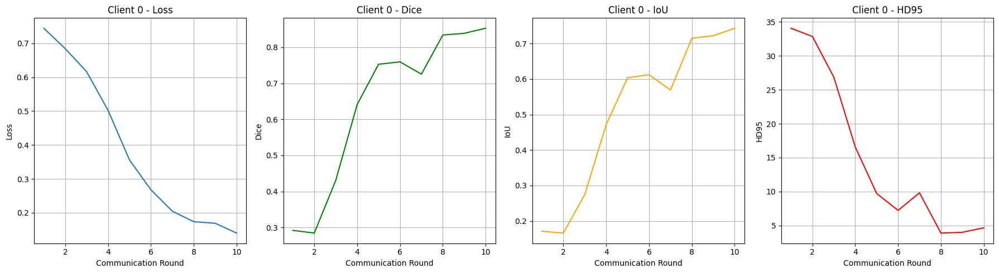

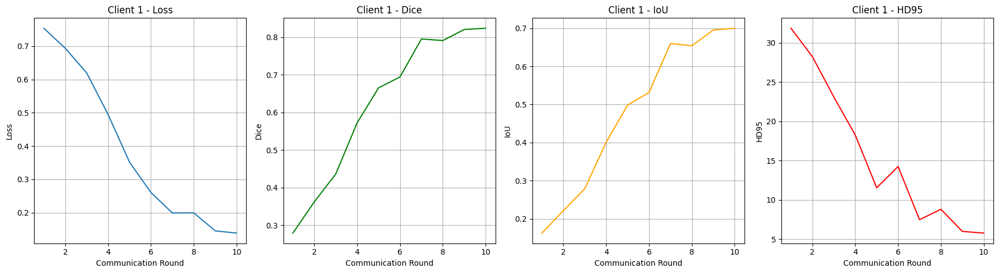

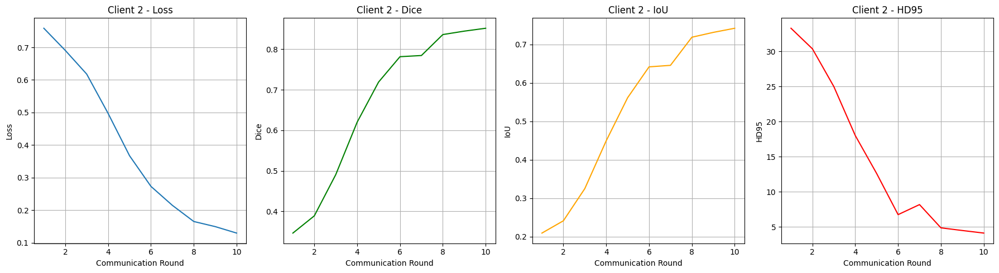

In [21]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"], color="red")
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

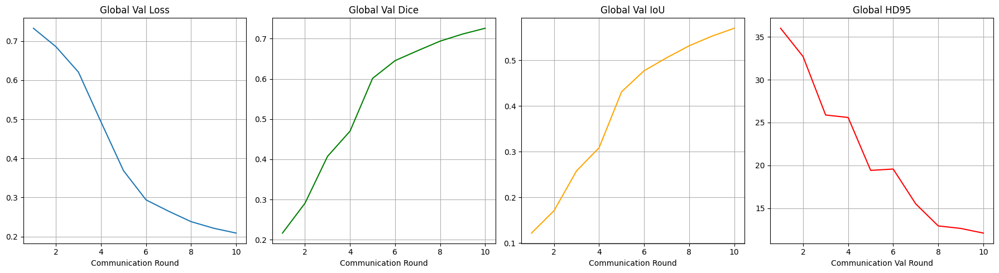

In [22]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [23]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

def load_client_model(client_id, device):
    model = create_model().to(device)
    state_dict = torch.load(f"client_{client_id}.pth", map_location=device)
    model.load_state_dict(state_dict)
    model.eval()
    return model

Test samples: 50


In [24]:
def evaluate_model(model, dataloader, device):
    dice_metric = DiceMetric(include_background=False, reduction="mean")
    hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    model.eval()

    total_loss = 0
    loss_fn = DiceLoss(sigmoid=True)

    with torch.no_grad():
        for batch in dataloader:
            images = batch["image"].to(device, dtype=torch.float32)
            masks  = batch["mask"].to(device, dtype=torch.float32)

            outputs = model(images)

            loss = 0.7 * loss_fn(outputs, masks) + 0.3 * nn.BCEWithLogitsLoss()(outputs, masks)
            total_loss += loss.item()

            preds = (torch.sigmoid(outputs) > 0.5).float()

            dice_metric(preds, masks)

            if masks.sum() > 0 and preds.sum() > 0:
                hd_metric(preds, masks)

    avg_loss = total_loss / len(dataloader)
    dice = dice_metric.aggregate().item()

    try:
        hd95 = hd_metric.aggregate().item()
    except ValueError:
        hd95 = float("nan")

    iou = dice / (2 - dice)

    dice_metric.reset()
    hd_metric.reset()

    return avg_loss, dice, iou, hd95

In [25]:
all_results = []

for client in clients:

    model = load_client_model(client.id, device)

    loss, dice, iou, hd95 = evaluate_model(model, test_loader, device)

    print(
        f"Client {client.id} | "
        f"Loss={loss:.4f} | Dice={dice:.4f} | IoU={iou:.4f} | HD95={hd95:.4f}"
    )

    all_results.append((loss, dice, iou, hd95))

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

C:\Users\LAB.LAB12-PC14\AppData\Local\Temp\ipykernel_13684\3450705386.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f"client_{client_id}.pth",

Client 0 | Loss=0.2392 | Dice=0.6848 | IoU=0.5207 | HD95=10.8743
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1

C:\Users\LAB.LAB12-PC14\AppData\Local\Temp\ipykernel_13684\3450705386.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f"client_{client_id}.pth",

Client 1 | Loss=0.2545 | Dice=0.6620 | IoU=0.4947 | HD95=9.8931
SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e

C:\Users\LAB.LAB12-PC14\AppData\Local\Temp\ipykernel_13684\3450705386.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f"client_{client_id}.pth",

Client 2 | Loss=0.2483 | Dice=0.6754 | IoU=0.5099 | HD95=8.5668


In [26]:
print("\n===== CLIENT-WISE FINAL SUMMARY =====")

for idx, client in enumerate(clients):

    loss = all_results[idx][0]
    dice = all_results[idx][1]
    iou  = all_results[idx][2]
    hd95 = all_results[idx][3]

    print(f"\nClient {client.id} Results:")
    print(f"Loss : {loss:.4f}")
    print(f"Dice : {dice:.4f}")
    print(f"IoU  : {iou:.4f}")

    if not np.isnan(hd95):
        print(f"HD95 : {hd95:.4f}")
    else:
        print("HD95 : NaN")


===== CLIENT-WISE FINAL SUMMARY =====

Client 0 Results:
Loss : 0.2392
Dice : 0.6848
IoU  : 0.5207
HD95 : 10.8743

Client 1 Results:
Loss : 0.2545
Dice : 0.6620
IoU  : 0.4947
HD95 : 9.8931

Client 2 Results:
Loss : 0.2483
Dice : 0.6754
IoU  : 0.5099
HD95 : 8.5668


**Visualize**

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

C:\Users\LAB.LAB12-PC14\AppData\Local\Temp\ipykernel_13684\3450705386.py:18: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f"client_{client_id}.pth",

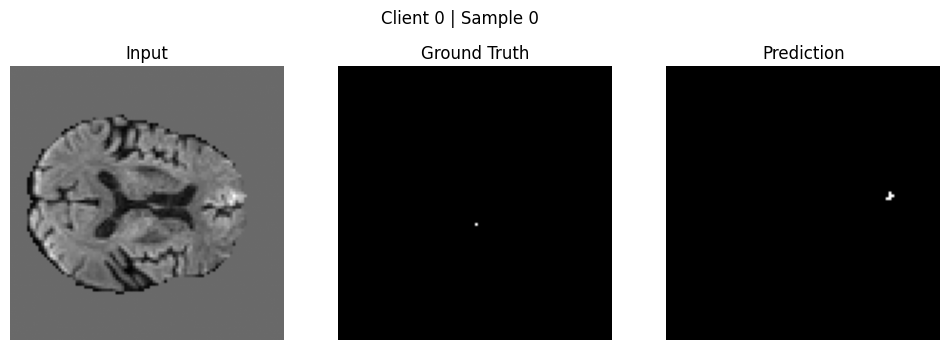

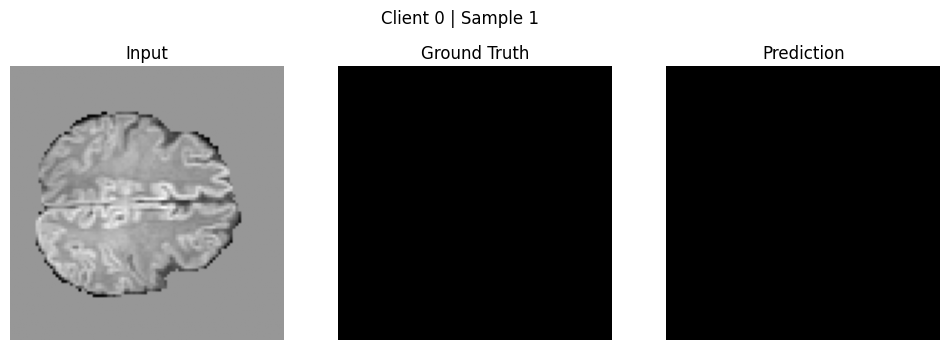

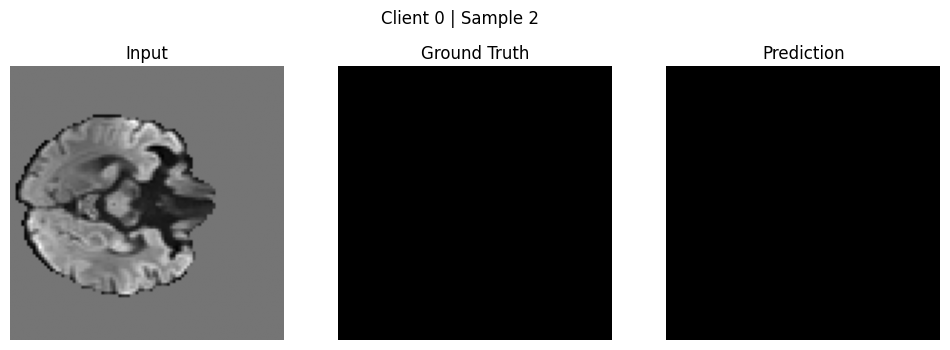

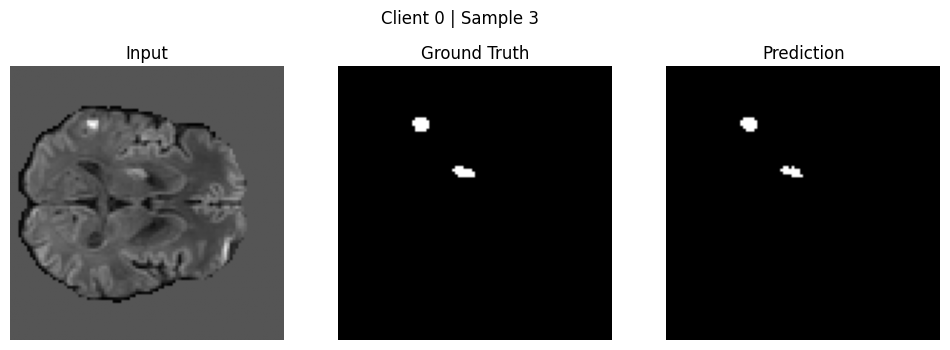

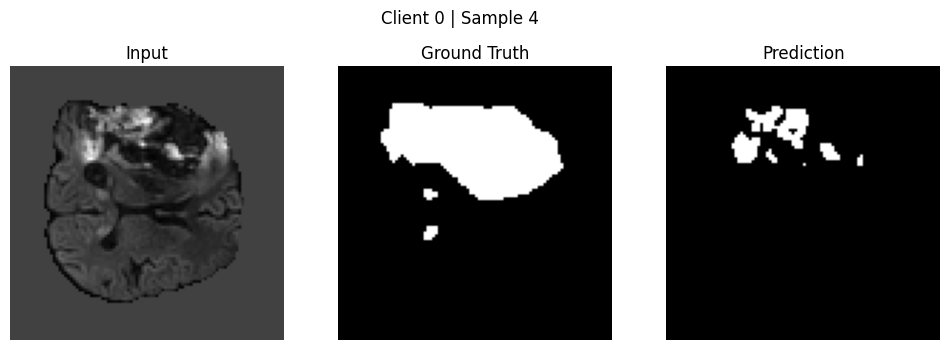

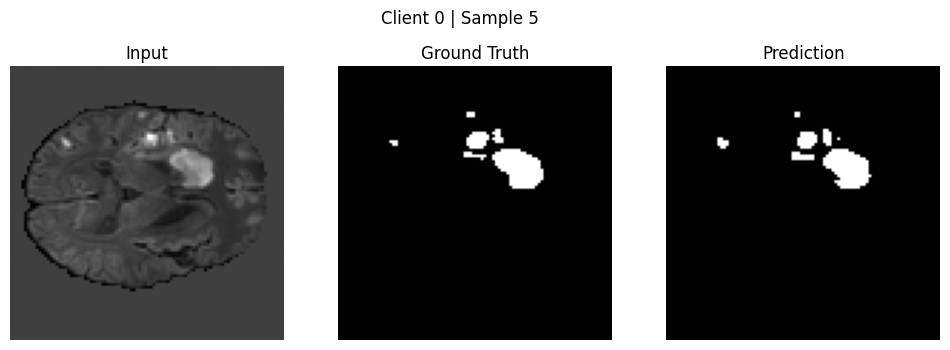

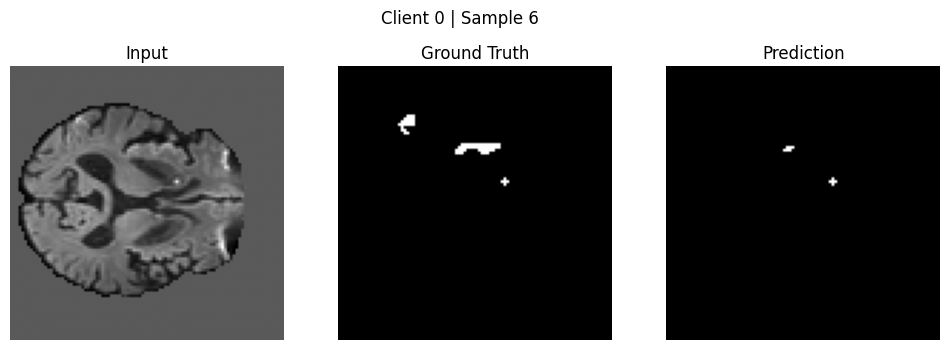

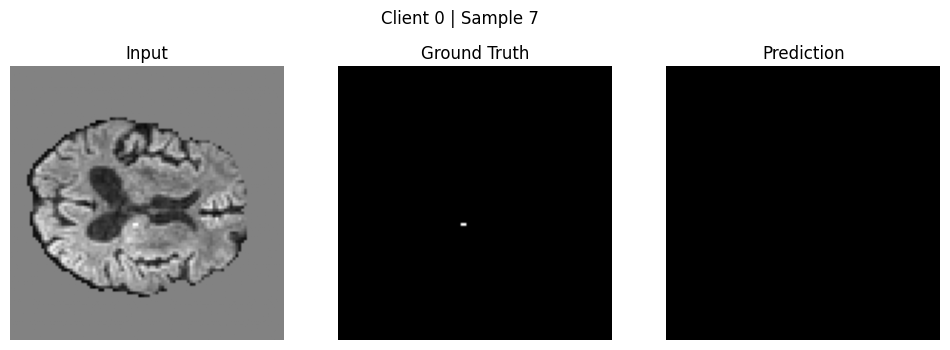

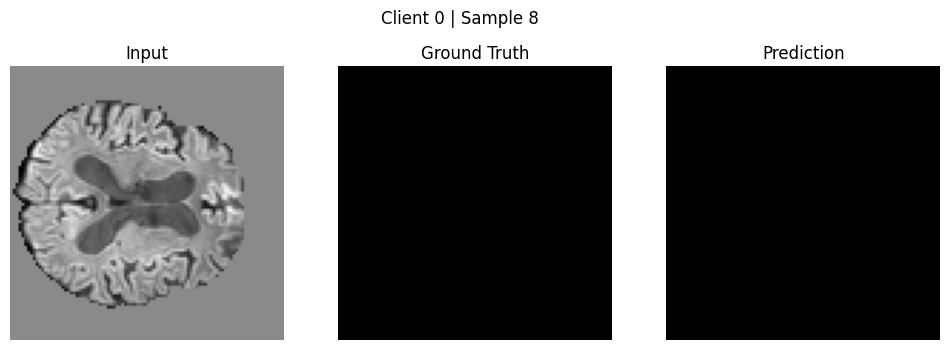

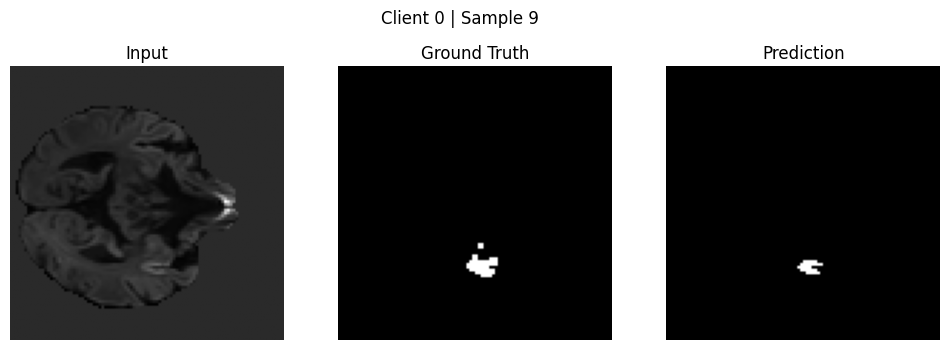

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

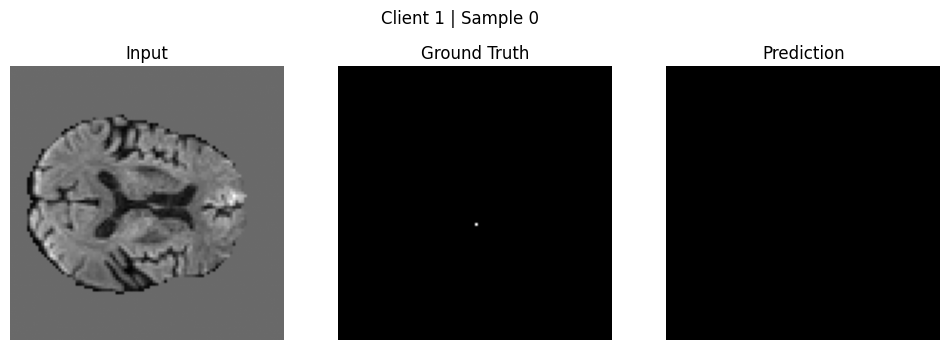

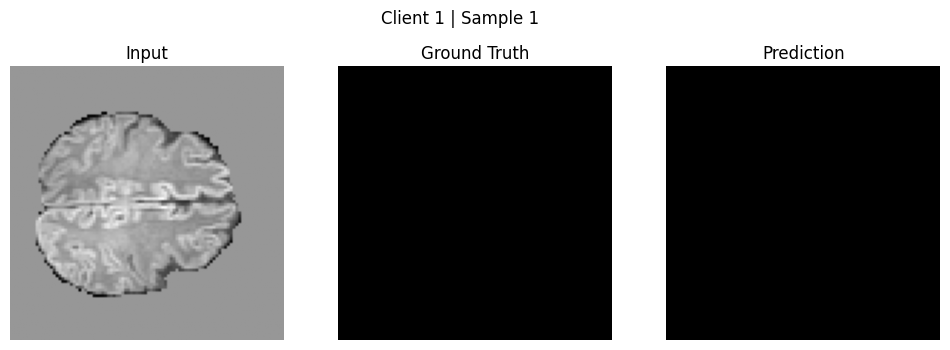

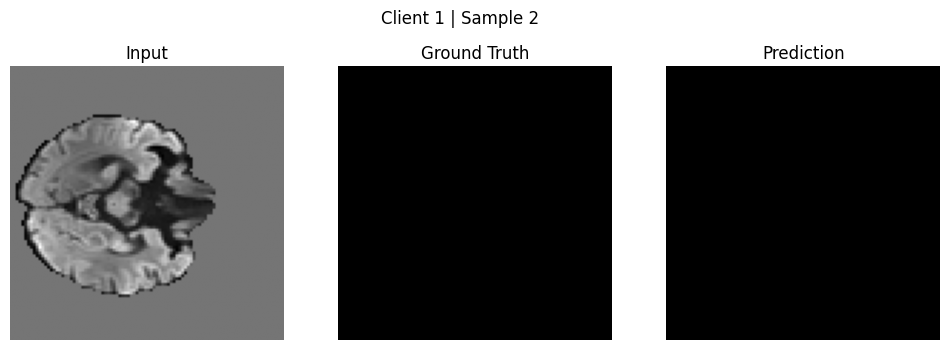

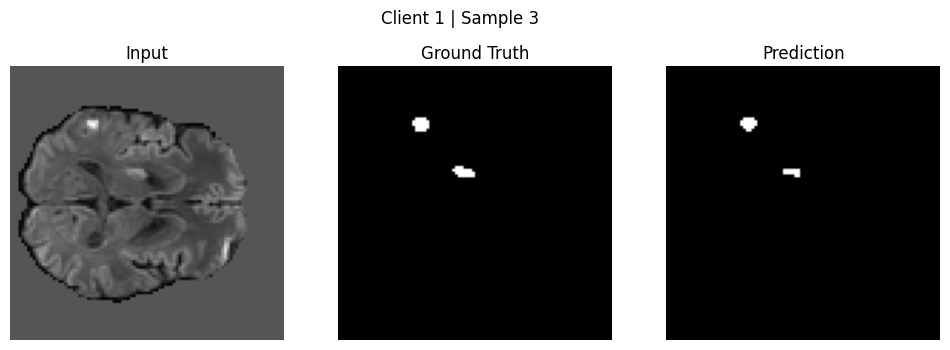

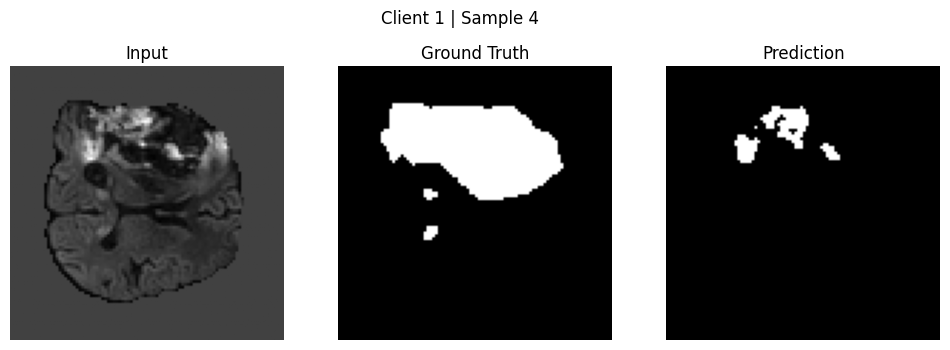

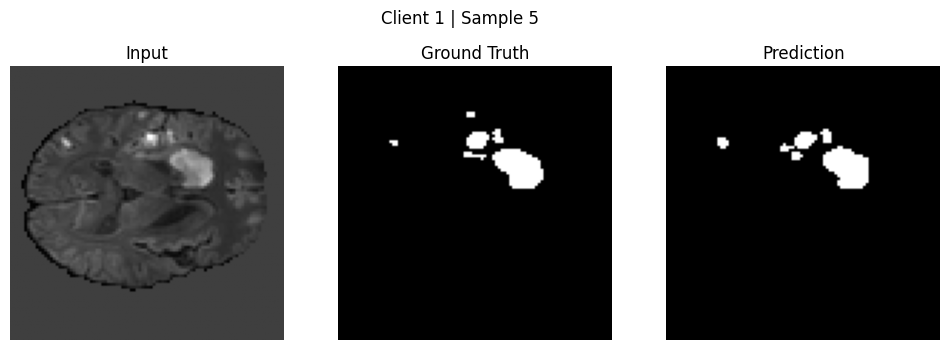

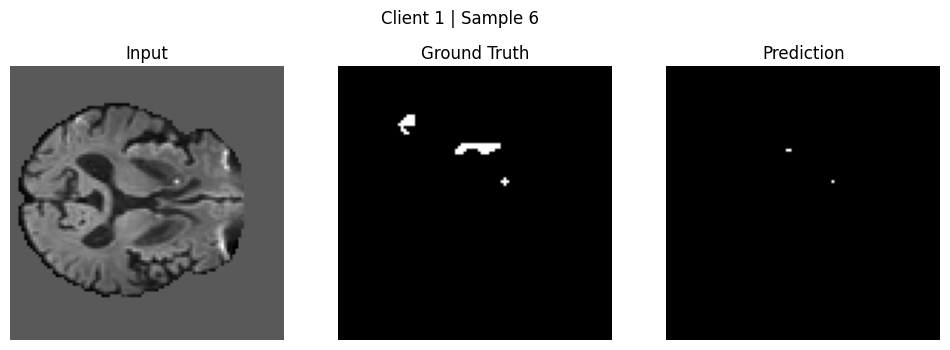

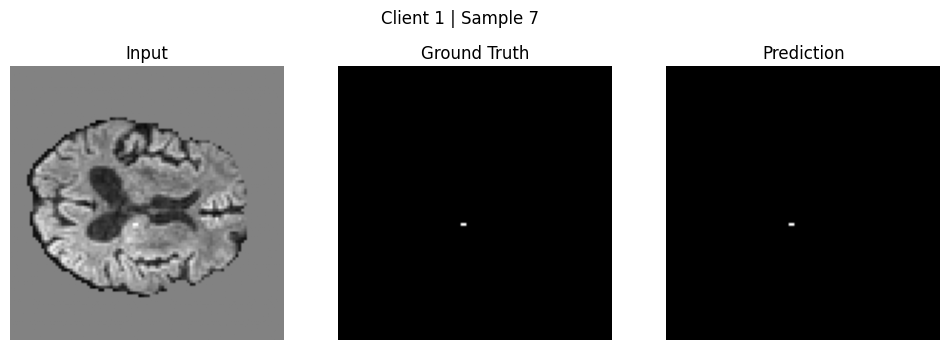

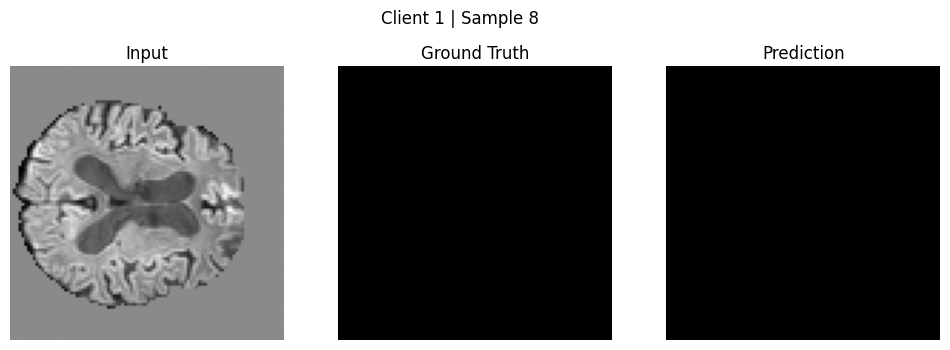

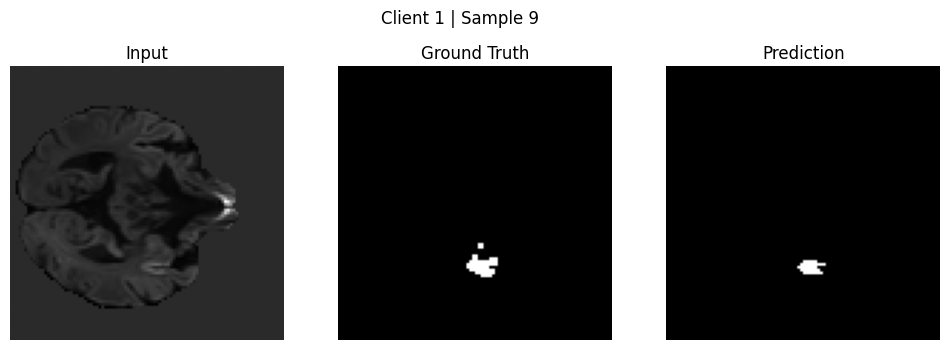

SegResNet(
  (act_mod): ReLU(inplace=True)
  (convInit): Convolution(
    (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
  )
  (down_layers): ModuleList(
    (0): Sequential(
      (0): Identity()
      (1): ResBlock(
        (norm1): GroupNorm(8, 16, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 16, eps=1e-05, affine=True)
        (act): ReLU(inplace=True)
        (conv1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
        (conv2): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1), bias=False)
        )
      )
    )
    (1): Sequential(
      (0): Convolution(
        (conv): Conv3d(16, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1), bias=False)
      )
      (1): ResBlock(
        (norm1): GroupNorm(8, 32, eps=1e-05, affine=True)
        (norm2): GroupNorm(8, 32, eps=1e-05, a

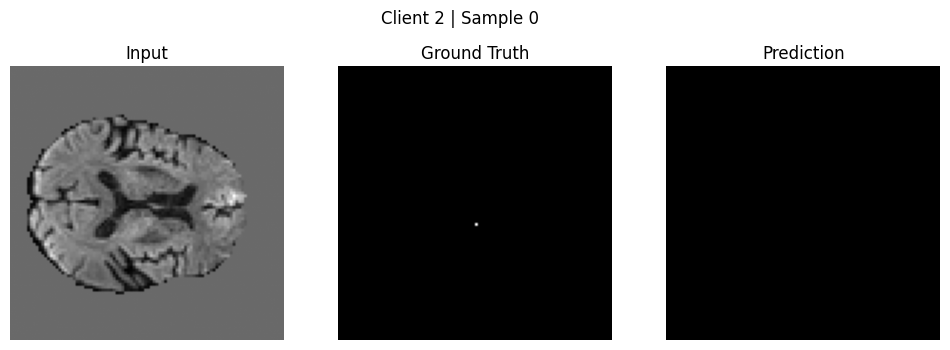

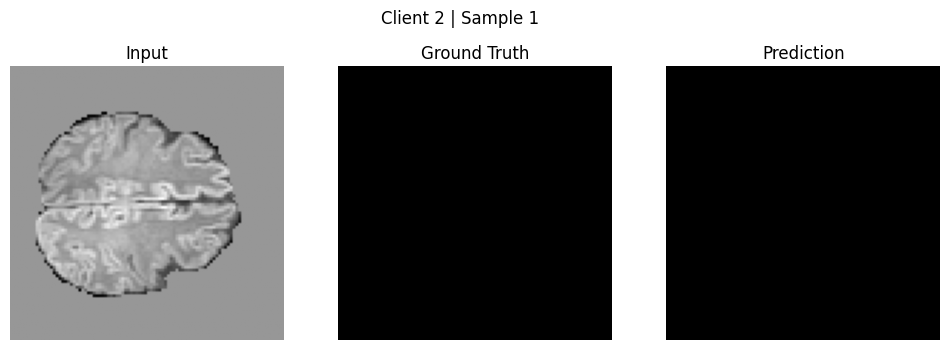

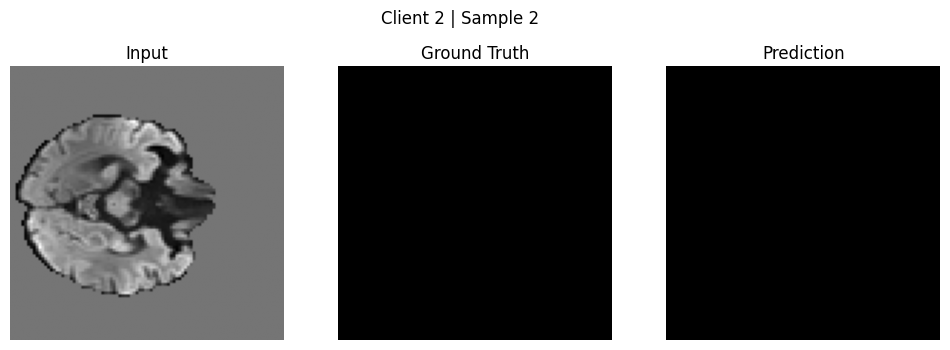

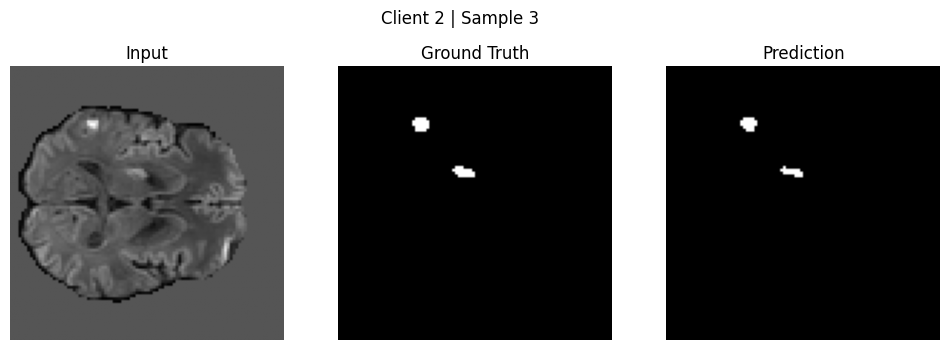

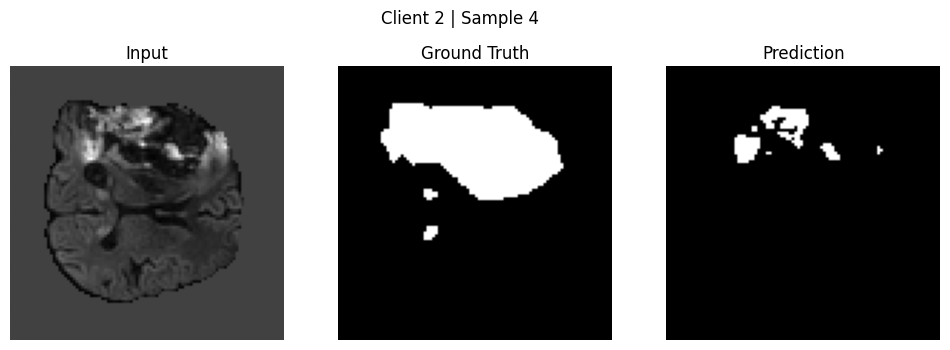

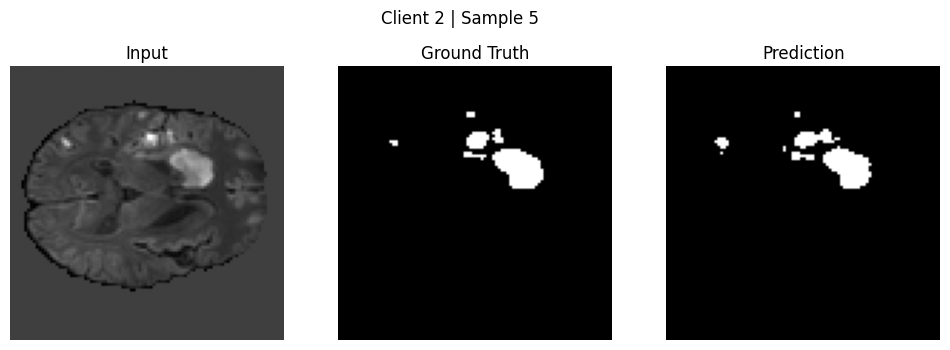

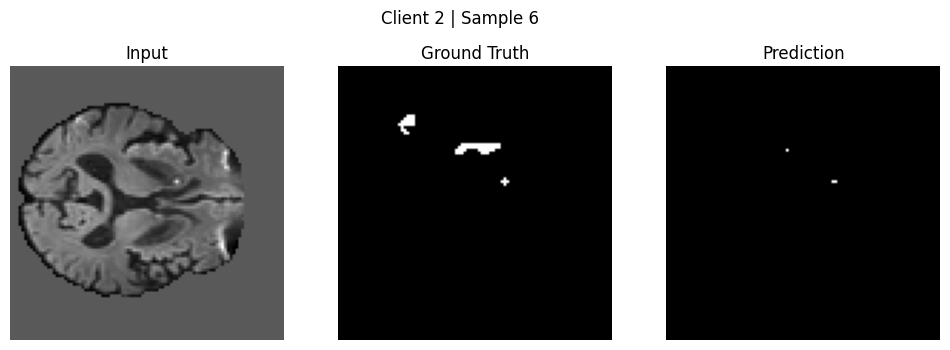

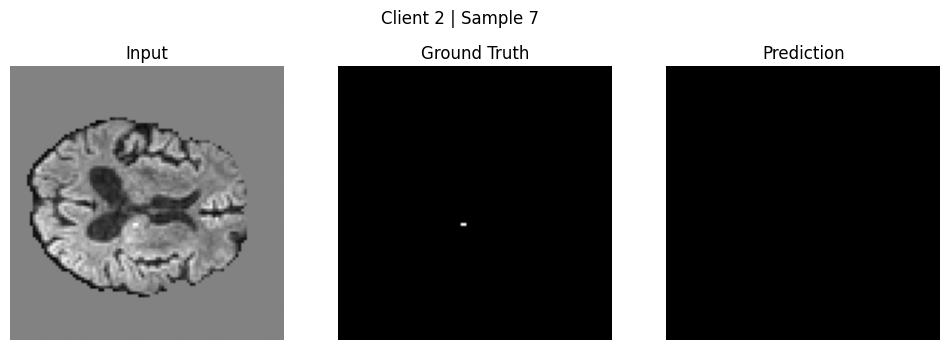

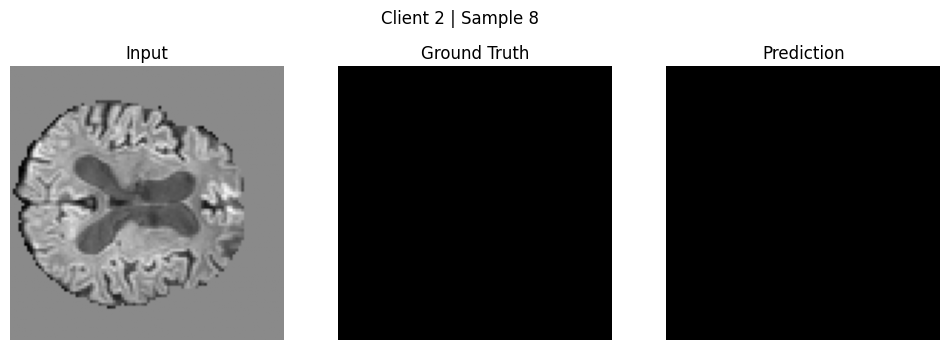

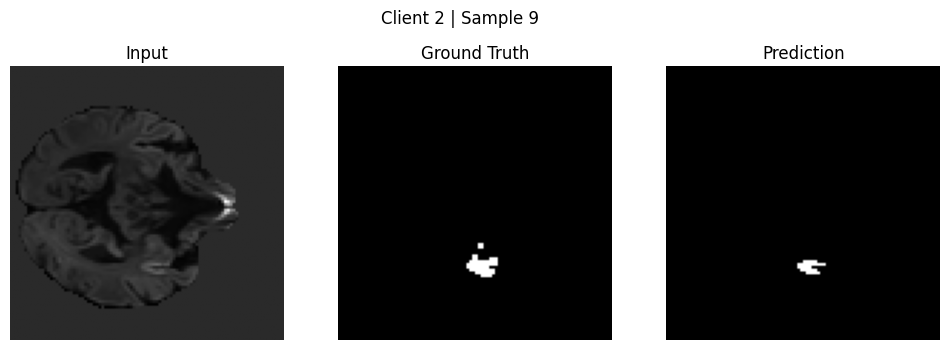

In [27]:
def visualize_model(model, dataset, device, client_id, num_samples=10):

    model.eval()

    for i in range(num_samples):

        sample = dataset[i]

        image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)

        image = sample["image"][0].cpu().numpy()
        mask  = sample["mask"][0].cpu().numpy()

        with torch.no_grad():
            output = model(image_tensor)
            pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

        mid = image.shape[2] // 2

        img_slice  = image[:, :, mid]
        mask_slice = mask[:, :, mid]
        pred_slice = pred[:, :, mid]

        plt.figure(figsize=(12,4))
        plt.suptitle(f"Client {client_id} | Sample {i}")

        plt.subplot(1,3,1)
        plt.imshow(img_slice, cmap="gray")
        plt.title("Input")
        plt.axis("off")

        plt.subplot(1,3,2)
        plt.imshow(mask_slice, cmap="gray")
        plt.title("Ground Truth")
        plt.axis("off")

        plt.subplot(1,3,3)
        plt.imshow(pred_slice, cmap="gray")
        plt.title("Prediction")
        plt.axis("off")

        plt.show()


for client in clients:
    model = load_client_model(client.id, device)
    visualize_model(model, test_dataset, device, client.id, num_samples=10)